## Laboratorio 2: Análisis exploratorio en un problema de clasificación

### Utilizaremos en esta práctica las siguientes librerías
[numpy](http://www.numpy.org/) permite manipular matrices de modo sencillo e incorpora funciones de cálculo útiles.  
[pandas](http://pandas.pydata.org/) proporciona estructuras de datos fáciles de usar y funciones de acceso a datos desde múltiples fuentes y formatos.  
[matplotlib](matplotlib.org) permite generar múltiples tipos de gráficos.  
[re](https://docs.python.org/2/library/re.html#) permite manipular expresiones regulares.

In [1]:
!pip3 install unidecode
!pip3 install brewer2mpl

In [2]:
%matplotlib inline
import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
import brewer2mpl
from matplotlib import rcParams

#colorbrewer2 Dark2 tabla de color cualitativa
dark2_cmap = brewer2mpl.get_map('Dark2', 'Qualitative', 7)
dark2_colors = dark2_cmap.mpl_colors

rcParams['figure.figsize'] = (10, 6)
rcParams['figure.dpi'] = 150
rcParams['lines.linewidth'] = 2
rcParams['axes.facecolor'] = 'white'
rcParams['font.size'] = 14
rcParams['patch.edgecolor'] = 'white'
rcParams['patch.facecolor'] = dark2_colors[0]
rcParams['font.family'] = 'StixGeneral'


# Para eliminar bordes en gráficas

def elimina_borde(axes=None, top=False, right=False, left=True, bottom=True):
    ax = axes or plt.gca()
    ax.spines['top'].set_visible(top)
    ax.spines['right'].set_visible(right)
    ax.spines['left'].set_visible(left)
    ax.spines['bottom'].set_visible(bottom)
    
    # Eliminar marcas
    ax.yaxis.set_ticks_position('none')
    ax.xaxis.set_ticks_position('none')
    
    # Rehabilitar visibles
    if top:
        ax.xaxis.tick_top()
    if bottom:
        ax.xaxis.tick_bottom()
    if left:
        ax.yaxis.tick_left()
    if right:
        ax.yaxis.tick_right()

In [4]:
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 100)

## Clasificación de aceites de oliva italianos

El punto de partida es una colección de datos extraídos de un conjunto de diferentes aceites de oliva. Cada muestra de aceite se representa mediante ocho parámetros, que se corresponden con los niveles de distintos ácidos grasos en cada aceite. Cada muestra de aceite pertenece a una de entre nueve variedades de aceite de oliva, de tres regiones y ocho áreas geográficas distintas de Italia. El objetivo del análisis es desarrollar un conjunto de reglas de clasificación que permitan distinguir de modo fiable los nueve aceites. Este es un problema de interés práctico, porque el aceite de algunas de las zonas está muy bien valorado, y existe cierto nivel de fraude en la denominación de origen.
Además, el contenido en ácidos grasos varía con el clima, lo que resulta relevante para decidir qué variedades se han de plantar en según qué zonas.

** Fuente: **  
Forina, M., Armanino, C., Lanteri, S. & Tiscornia, E. (1983), Classification of Olive Oils from their Fatty Acid Composition, in Martens, H. and
Russwurm Jr., H., eds, Food Research and Data Analysis, Applied Science
Publishers, London, pp. 189–214.

Número de muestras: 572

Número de variables: 10

*Descripción:* Los datos representan el porcentaje (x100) de ácidos grasos en la fracción lipídica de un conjunto de muestras de aceites de oliva procedentes de Italia. Los datos proceden de un estudio cuyo objetivo es la determinación de la autenticidad de la denominación de origen en el aceite de oliva.

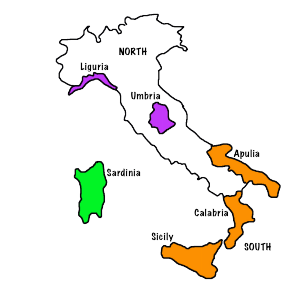

In [5]:
from IPython.display import Image
Image(filename='Italy.png')

## 1. Cargamos y limpiamos los datos
Cargamos los datos desde el fichero oliva.csv mediante las librerías pandas y visualizamos al menos las 5 primeras filas de datos. Como el fichero está en formato .csv buscamos la existencia de alguna función en pandas de nombre  `read_csv()`.

In [6]:
#almacenamos los datos del fichero 
#en el objeto 'datos', de tipo Dataframe

# Cargar los datos desde el archivo CSV
datos = pd.read_csv('oliva.csv')

# Visualizar las primeras 5 filas de datos 
# df.head(num_filas_show) num_filas_show el default es 5 
# df.head(5) = df.head()
print(datos.head(5))

      Unnamed: 0  región  área  palmítico  palmitoleico  esteárico  oleico  linoleico  linolénico  araquídico  eicosenoico
0  1.Puglia-Nord       1     1       1075            75        226    7823        672          36          60           29
1  2.Puglia-Nord       1     1       1088            73        224    7709        781          31          61           29
2  3.Puglia-Nord       1     1        911            54        246    8113        549          31          63           29
3  4.Puglia-Nord       1     1        966            57        240    7952        619          50          78           35
4  5.Puglia-Nord       1     1       1051            67        259    7771        672          50          80           46


Pondremos nombre a la primera columna, que carece de él. Para ello podemos consultar la existencia de alguna función en pandas de nombre `rename()`.

In [7]:
def plot_table(df):
    #función para aplicar el estilo de fondo alternado por filas enteras
    def alternating_background_color(row):
        #print(row.name)
        val=row.name
        if isinstance(val, str):
            val = int(val.split('.')[0])-1
        if val % 2 == 0:
            return ['background-color: lightblue; border: 1px solid black; text-align: center;'] * len(row)
        else:
            return ['background-color: lighgray; border: 1px solid black; text-align: center;'] * len(row)

    
    # Aplica la función a las filas enteras del DataFrame y al índice
    styled_df = df.style.apply(alternating_background_color, axis=1)
    return styled_df

In [8]:
# Mostrar el DataFrame con el formato aplicado
plot_table(datos.head(5))

,Unnamed: 0,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,1.Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,2.Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,3.Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,4.Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,5.Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46


In [9]:
datos = pd.read_csv('oliva.csv')
# Imprimimos en primer lugar los títulos de las columnas, que se encuentran en datos.columns
print(datos.columns)
# Cambiamos columns[0] por 'procedencia'
datos.rename(columns={datos.columns[0]: 'procedencia'}, inplace=True)
print(datos.columns)
plot_table(datos.head(5))

Index(['Unnamed: 0', 'región', 'área', 'palmítico', 'palmitoleico', 'esteárico', 'oleico', 'linoleico', 'linolénico', 'araquídico', 'eicosenoico'], dtype='object')
Index(['procedencia', 'región', 'área', 'palmítico', 'palmitoleico', 'esteárico', 'oleico', 'linoleico', 'linolénico', 'araquídico', 'eicosenoico'], dtype='object')


,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,1.Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,2.Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,3.Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,4.Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,5.Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46


In [10]:
df_p=datos.copy()
# En este caso cambiamos el indice para para que data frame nos deje visualizar la 
#  procedencia sin tener que selecionar esta columna 
df_p.set_index("procedencia",inplace=True)
plot_table(df_p.head(5))

,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
procedencia,,,,,,,,,,
1.Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
2.Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
3.Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
4.Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
5.Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46


Queremos acceder a la subtabla formada por las columnas `oleico` y `linoleico`.

In [11]:
oleo_p=df_p.loc[:,["oleico","linoleico"]]
plot_table(oleo_p.head(5))

,oleico,linoleico
procedencia,,
1.Puglia-Nord,7823,672
2.Puglia-Nord,7709,781
3.Puglia-Nord,8113,549
4.Puglia-Nord,7952,619
5.Puglia-Nord,7771,672


Varias maneras de visualizar la misma tabla

In [12]:
oleo=datos.loc[:,["procedencia","oleico","linoleico"]]
plot_table(oleo.head(5))

,procedencia,oleico,linoleico
0,1.Puglia-Nord,7823,672
1,2.Puglia-Nord,7709,781
2,3.Puglia-Nord,8113,549
3,4.Puglia-Nord,7952,619
4,5.Puglia-Nord,7771,672


In [13]:
subtabla_oleico_linoleico=datos.loc[:,["oleico","linoleico"]]
# la podemos visualizar de forma traspuesta al ser solo dos
subtabla_oleico_linoleico.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,...,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571
oleico,7823,7709,8113,7952,7771,7924,7990,7728,7745,7944,7978,7868,7728,8018,7795,7606,7840,7344,7958,7820,7692,7806,7703,7876,7779,7299,7174,7234,7127,7253,7285,7083,7257,7337,7309,7441,7395,7323,7299,7209,7354,7238,7160,7129,7351,7351,7394,7167,7261,7262,...,7340,7550,7530,7600,7480,7680,7620,7740,7530,7760,7600,7610,7590,7720,7540,7810,7780,7600,7610,7850,7620,7700,7450,7690,7630,7630,7780,7810,7620,7620,7610,7720,7710,7820,7810,7710,7800,7650,7710,7630,7820,7720,7810,7720,7730,7490,7740,7720,7750,7950
linoleico,672,781,549,619,672,678,618,734,709,633,605,661,747,655,780,816,788,957,742,736,716,679,700,703,696,832,950,874,940,903,892,915,870,820,823,798,829,819,840,866,870,877,928,897,757,839,786,939,925,780,...,1020,1000,1030,990,1050,830,880,900,970,980,990,850,860,910,1040,940,930,1010,730,690,960,1020,1010,850,1030,940,820,810,920,1010,930,910,900,830,840,910,850,830,800,770,760,810,750,950,870,790,810,970,870,740


In [14]:
# Añadimos procedencia para visualizarla
subtabla_oleico_linoleico=datos.loc[:,["procedencia","oleico","linoleico"]]
subtabla_oleico_linoleico.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,...,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571
procedencia,1.Puglia-Nord,2.Puglia-Nord,3.Puglia-Nord,4.Puglia-Nord,5.Puglia-Nord,6.Puglia-Nord,7.Puglia-Nord,8.Puglia-Nord,9.Puglia-Nord,10.Puglia-Nord,11.Puglia-Nord,12.Puglia-Nord,13.Puglia-Nord,14.Puglia-Nord,15.Puglia-Nord,16.Puglia-Nord,17.Puglia-Nord,18.Puglia-Nord,19.Puglia-Nord,20.Puglia-Nord,21.Puglia-Nord,22.Puglia-Nord,23.Puglia-Nord,24.Puglia-Nord,25.Puglia-Nord,26.Calabria,27.Calabria,28.Calabria,29.Calabria,30.Calabria,31.Calabria,32.Calabria,33.Calabria,34.Calabria,35.Calabria,36.Calabria,37.Calabria,38.Calabria,39.Calabria,40.Calabria,41.Calabria,42.Calabria,43.Calabria,44.Calabria,45.Calabria,46.Calabria,47.Calabria,48.Calabria,49.Calabria,50.Calabria,...,523.Liguria-Ovest,524.Liguria-Ovest,525.Liguria-Ovest,526.Liguria-Ovest,527.Liguria-Ovest,528.Liguria-Ovest,529.Liguria-Ovest,530.Liguria-Ovest,531.Liguria-Ovest,532.Liguria-Ovest,533.Liguria-Ovest,534.Liguria-Ovest,535.Liguria-Ovest,536.Liguria-Ovest,537.Liguria-Ovest,538.Liguria-Ovest,539.Liguria-Ovest,540.Liguria-Ovest,541.Liguria-Ovest,542.Liguria-Ovest,543.Liguria-Ovest,544.Liguria-Ovest,545.Liguria-Ovest,546.Liguria-Ovest,547.Liguria-Ovest,548.Liguria-Ovest,549.Liguria-Ovest,550.Liguria-Ovest,551.Liguria-Ovest,552.Liguria-Ovest,553.Liguria-Ovest,554.Liguria-Ovest,555.Liguria-Ovest,556.Liguria-Ovest,557.Liguria-Ovest,558.Liguria-Ovest,559.Liguria-Ovest,560.Liguria-Ovest,561.Liguria-Ovest,562.Liguria-Ovest,563.Liguria-Ovest,564.Liguria-Ovest,565.Liguria-Ovest,566.Liguria-Ovest,567.Liguria-Ovest,568.Liguria-Ovest,569.Liguria-Ovest,570.Liguria-Ovest,571.Liguria-Ovest,572.Liguria-Ovest
oleico,7823,7709,8113,7952,7771,7924,7990,7728,7745,7944,7978,7868,7728,8018,7795,7606,7840,7344,7958,7820,7692,7806,7703,7876,7779,7299,7174,7234,7127,7253,7285,7083,7257,7337,7309,7441,7395,7323,7299,7209,7354,7238,7160,7129,7351,7351,7394,7167,7261,7262,...,7340,7550,7530,7600,7480,7680,7620,7740,7530,7760,7600,7610,7590,7720,7540,7810,7780,7600,7610,7850,7620,7700,7450,7690,7630,7630,7780,7810,7620,7620,7610,7720,7710,7820,7810,7710,7800,7650,7710,7630,7820,7720,7810,7720,7730,7490,7740,7720,7750,7950
linoleico,672,781,549,619,672,678,618,734,709,633,605,661,747,655,780,816,788,957,742,736,716,679,700,703,696,832,950,874,940,903,892,915,870,820,823,798,829,819,840,866,870,877,928,897,757,839,786,939,925,780,...,1020,1000,1030,990,1050,830,880,900,970,980,990,850,860,910,1040,940,930,1010,730,690,960,1020,1010,850,1030,940,820,810,920,1010,930,910,900,830,840,910,850,830,800,770,760,810,750,950,870,790,810,970,870,740


In [15]:
subtabla_oleico_linoleico_p=df_p.loc[:,["oleico","linoleico"]]
# aqui se puede observar que no es necesaio añadir la procedencia
subtabla_oleico_linoleico_p.T

procedencia,1.Puglia-Nord,2.Puglia-Nord,3.Puglia-Nord,4.Puglia-Nord,5.Puglia-Nord,6.Puglia-Nord,7.Puglia-Nord,8.Puglia-Nord,9.Puglia-Nord,10.Puglia-Nord,11.Puglia-Nord,12.Puglia-Nord,13.Puglia-Nord,14.Puglia-Nord,15.Puglia-Nord,16.Puglia-Nord,17.Puglia-Nord,18.Puglia-Nord,19.Puglia-Nord,20.Puglia-Nord,21.Puglia-Nord,22.Puglia-Nord,23.Puglia-Nord,24.Puglia-Nord,25.Puglia-Nord,26.Calabria,27.Calabria,28.Calabria,29.Calabria,30.Calabria,31.Calabria,32.Calabria,33.Calabria,34.Calabria,35.Calabria,36.Calabria,37.Calabria,38.Calabria,39.Calabria,40.Calabria,41.Calabria,42.Calabria,43.Calabria,44.Calabria,45.Calabria,46.Calabria,47.Calabria,48.Calabria,49.Calabria,50.Calabria,...,523.Liguria-Ovest,524.Liguria-Ovest,525.Liguria-Ovest,526.Liguria-Ovest,527.Liguria-Ovest,528.Liguria-Ovest,529.Liguria-Ovest,530.Liguria-Ovest,531.Liguria-Ovest,532.Liguria-Ovest,533.Liguria-Ovest,534.Liguria-Ovest,535.Liguria-Ovest,536.Liguria-Ovest,537.Liguria-Ovest,538.Liguria-Ovest,539.Liguria-Ovest,540.Liguria-Ovest,541.Liguria-Ovest,542.Liguria-Ovest,543.Liguria-Ovest,544.Liguria-Ovest,545.Liguria-Ovest,546.Liguria-Ovest,547.Liguria-Ovest,548.Liguria-Ovest,549.Liguria-Ovest,550.Liguria-Ovest,551.Liguria-Ovest,552.Liguria-Ovest,553.Liguria-Ovest,554.Liguria-Ovest,555.Liguria-Ovest,556.Liguria-Ovest,557.Liguria-Ovest,558.Liguria-Ovest,559.Liguria-Ovest,560.Liguria-Ovest,561.Liguria-Ovest,562.Liguria-Ovest,563.Liguria-Ovest,564.Liguria-Ovest,565.Liguria-Ovest,566.Liguria-Ovest,567.Liguria-Ovest,568.Liguria-Ovest,569.Liguria-Ovest,570.Liguria-Ovest,571.Liguria-Ovest,572.Liguria-Ovest
oleico,7823,7709,8113,7952,7771,7924,7990,7728,7745,7944,7978,7868,7728,8018,7795,7606,7840,7344,7958,7820,7692,7806,7703,7876,7779,7299,7174,7234,7127,7253,7285,7083,7257,7337,7309,7441,7395,7323,7299,7209,7354,7238,7160,7129,7351,7351,7394,7167,7261,7262,...,7340,7550,7530,7600,7480,7680,7620,7740,7530,7760,7600,7610,7590,7720,7540,7810,7780,7600,7610,7850,7620,7700,7450,7690,7630,7630,7780,7810,7620,7620,7610,7720,7710,7820,7810,7710,7800,7650,7710,7630,7820,7720,7810,7720,7730,7490,7740,7720,7750,7950
linoleico,672,781,549,619,672,678,618,734,709,633,605,661,747,655,780,816,788,957,742,736,716,679,700,703,696,832,950,874,940,903,892,915,870,820,823,798,829,819,840,866,870,877,928,897,757,839,786,939,925,780,...,1020,1000,1030,990,1050,830,880,900,970,980,990,850,860,910,1040,940,930,1010,730,690,960,1020,1010,850,1030,940,820,810,920,1010,930,910,900,830,840,910,850,830,800,770,760,810,750,950,870,790,810,970,870,740


El resultado es un nuevo objeto, del tipo `DataFrame` de pandas. Queremos ahora acceder a una sola de las columnas, por ejemplo, la del ácido esteárico.

In [16]:
name="esteárico"
print(f"Columna de {name}")
_data_frame=datos[name].T
print(f"Tipo de la Columna  {type(_data_frame)}")
display(_data_frame)

Columna de esteárico
Tipo de la Columna  <class 'pandas.core.series.Series'>


0      226
1      224
2      246
3      240
4      259
      ... 
567    290
568    270
569    210
570    250
571    240
Name: esteárico, Length: 572, dtype: int64

In [17]:
print(f"Tabla con la columna de {name}")
_data_frame=datos.loc[:,[name]]
print(f"Tipo de la Columna con loc  {type(_data_frame)}")
display(_data_frame)

Tabla con la columna de esteárico
Tipo de la Columna con loc  <class 'pandas.core.frame.DataFrame'>


,esteárico
0,226
1,224
2,246
3,240
4,259
...,...
567,290
568,270
569,210
570,250


El objeto obtenido es un objeto del tipo `Series` de pandas. Si utilizamos dos corchetes para indexar a partir de una lista obtendremos un objeto de tipo Dataframe. Analizaremos los tipos de ambos ejemplos mediante la función `type()`.

In [18]:
print ("tipo de datos[[u'esteárico']]:\t", type(datos[[u'esteárico']]))
print ("tipo de datos[u'esteárico']:\t", type(datos[u'esteárico']))

tipo de datos[[u'esteárico']]:	 <class 'pandas.core.frame.DataFrame'>
tipo de datos[u'esteárico']:	 <class 'pandas.core.series.Series'>


Si los nombres no tienen acentos podemos acceder a cada columna de una manera más sencilla, por ejemplo, mediante `datos.estearico`.

In [19]:
from unidecode import unidecode

def eliminar_acentos_en_columnas(dataframe, columnas):
    """
    Elimina los acentos de los caracteres en las columnas especificadas de un DataFrame de pandas.

    Args:
        dataframe (pd.DataFrame): El DataFrame en el que se realizará la eliminación de acentos.
        columnas (list): Lista de nombres de las columnas en las que se eliminarán los acentos.

    Returns:
        pd.DataFrame: El DataFrame original con los acentos eliminados en las columnas especificadas.
    """
    df_copia = dataframe.copy()
    # para  quitar los acentos en el contenido de las columnas
    for columna in columnas:
        df_copia[columna] = df_copia[columna].apply(lambda x: unidecode(str(x)))
    for i,x in enumerate(df_copia.columns):
        df_copia.rename(columns={df_copia.columns[i]: unidecode(str(x))}, inplace=True)
    #columnas_sin_acentos= [unidecode(str(x)) for x in df_sin_acentos.columns]
    return df_copia



**NOTA:** En esta versión de jupyter notebook  si permite acentos, pero también se puede quitar los acentos tratando el nombre de los data frame, pero dado que en esta versión si lo permite continuaremos como esta.

In [20]:
!python --version
!jupyter notebook --version

Python 3.7.16
6.5.6


In [21]:
datos.esteárico

0      226
1      224
2      246
3      240
4      259
      ... 
567    290
568    270
569    210
570    250
571    240
Name: esteárico, Length: 572, dtype: int64

A partir de aquí se usará solo dataframe ‘datos’ para no generar problemas con el índice en
pandas ‘df_p’ que al querer quitar los números de procedencia podría dar problemas, además
que para el resto de notebook es más práctico usar ‘datos’ se podría usar el sin acentos pero se decidió no hacerlo puesto que así mantenemos información sobre las label.

In [22]:
datos_sin_acentos = eliminar_acentos_en_columnas(datos, [datos.columns[0]])
display(datos_sin_acentos)

,procedencia,region,area,palmitico,palmitoleico,estearico,oleico,linoleico,linolenico,araquidico,eicosenoico
0,1.Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,2.Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,3.Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,4.Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,5.Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46
...,...,...,...,...,...,...,...,...,...,...,...
567,568.Liguria-Ovest,3,8,1280,110,290,7490,790,10,10,2
568,569.Liguria-Ovest,3,8,1060,100,270,7740,810,10,10,3
569,570.Liguria-Ovest,3,8,1010,90,210,7720,970,0,0,2
570,571.Liguria-Ovest,3,8,990,120,250,7750,870,10,10,2


Volvemos a nuestra tabla de datos. Eliminaremos el número que acompaña a cada región de procedencia, ya que se extrajo del fichero junto con el nombre porque ambos aparecen separados por un punto. Para ello podemos utilizar tanto la función `split()` como la función `sub()` de la librería `re` de expresiones regulares, junto con la función `map()` para realizar el cambio con cada uno de los elementos de la columna de procedencia.

In [23]:
# Utilizamos una asignación del tipo datos['procedencia']=datos['procedencia'].map()
# Copia del DataFrame original
datos_split = datos.copy()
# Utiliza la función split() de la librería re junto con map() para dividir la columna 
#'procedencia' y eliminar el número
datos_split['procedencia'] = datos_split['procedencia'].map(lambda x: re.split('\.', x)[1])
display(datos_split)

,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46
...,...,...,...,...,...,...,...,...,...,...,...
567,Liguria-Ovest,3,8,1280,110,290,7490,790,10,10,2
568,Liguria-Ovest,3,8,1060,100,270,7740,810,10,10,3
569,Liguria-Ovest,3,8,1010,90,210,7720,970,0,0,2
570,Liguria-Ovest,3,8,990,120,250,7750,870,10,10,2


In [24]:
# otra manera

# Copia del DataFrame original
df_split2 = datos_sin_acentos.copy()
# Aplicar re.split('\.', ...) a cada valor de la columna 'procedencia' junto con apply en vez de map
df_split2['procedencia'] = df_split2['procedencia'].apply(lambda x: re.split('\.', x)[1])
df_split2


,procedencia,region,area,palmitico,palmitoleico,estearico,oleico,linoleico,linolenico,araquidico,eicosenoico
0,Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46
...,...,...,...,...,...,...,...,...,...,...,...
567,Liguria-Ovest,3,8,1280,110,290,7490,790,10,10,2
568,Liguria-Ovest,3,8,1060,100,270,7740,810,10,10,3
569,Liguria-Ovest,3,8,1010,90,210,7720,970,0,0,2
570,Liguria-Ovest,3,8,990,120,250,7750,870,10,10,2


In [25]:
# otra manera
# Copia del DataFrame original
df_split3 = datos_sin_acentos.copy()
# Utiliza la función sub() de la librería re junto con map() para dividir la columna 
#'procedencia' 
# y eliminar el número
df_split3['procedencia'] = df_split3['procedencia'].map(lambda x: re.sub(r'^\d+\.\s*', '', x))
df_split3

,procedencia,region,area,palmitico,palmitoleico,estearico,oleico,linoleico,linolenico,araquidico,eicosenoico
0,Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46
...,...,...,...,...,...,...,...,...,...,...,...
567,Liguria-Ovest,3,8,1280,110,290,7490,790,10,10,2
568,Liguria-Ovest,3,8,1060,100,270,7740,810,10,10,3
569,Liguria-Ovest,3,8,1010,90,210,7720,970,0,0,2
570,Liguria-Ovest,3,8,990,120,250,7750,870,10,10,2


**NOTA:** Como se pude observar los tres métodos actuan de manera igual sobre el data frame.

Resulta un poco confusa la existencia de una columna región y otra área, además de la que nombra la procedencia. Consultaremos qué valores distintos hay en ambas columnas. En este caso es sencillo porque el conjunto de datos no es muy extenso, pero utilizaremos la función `unique()` para hacer este análisis extensivo a cualquier conjunto de datos verdaderamente grande.

In [26]:
valores_region = datos_split['región'].unique()
valores_area = datos_split['área'].unique()


# Luego puedes imprimir los valores únicos para cada columna:
print("Valores únicos en la columna 'región':")
print(valores_region)

print("\nValores únicos en la columna 'área':")
print(valores_area)



Valores únicos en la columna 'región':
[1 2 3]

Valores únicos en la columna 'área':
[1 2 3 4 5 6 9 7 8]


Necesitamos saber cuántas zonas únicas hay en el conjunto de datos, ya que a ellas asignaremos cada etiqueta de clase. Para ello podemos realizar una tabla de contingencia entre las etiquetas de regiones y las etiquetas de áreas. En python podemos hacer esto mediante la función `crosstab()`.

In [27]:
# Crear una tabla de contingencia que tenga la combinatoria de los valores únicos en las
# columnas 'región' y 'área' con una nueva columna que indique la suma de las zonas
tabla_contingencia = pd.crosstab(datos_split['región'], \
                                 datos_split['área'],margins=True, margins_name="Total_zonas")
# Para saber cuántas zonas únicas hay en el conjunto de datos, puedes obtener los índices 
# únicos de ambas columnas y contarlos.

zonas_únicas_región = datos_split['región'].nunique()
zonas_únicas_área = datos_split['área'].nunique()

# Imprimir el número de zonas únicas en cada columna:
print("Número de zonas únicas en la columna 'región':", zonas_únicas_región)
print("Número de zonas únicas en la columna 'área':", zonas_únicas_área)

# Además, puedes imprimir la tabla de contingencia para ver la distribución de las 
#etiquetas de región y área.
print("\nTabla de contingencia:")
print(tabla_contingencia)

Número de zonas únicas en la columna 'región': 3
Número de zonas únicas en la columna 'área': 9

Tabla de contingencia:
área          1   2    3   4   5   6   7   8   9  Total_zonas
región                                                       
1            25  56  206  36   0   0   0   0   0          323
2             0   0    0   0  65  33   0   0   0           98
3             0   0    0   0   0   0  50  50  51          151
Total_zonas  25  56  206  36  65  33  50  50  51          572


Generamos el conjunto de valores diferentes de la columna procedencia mediante la función `unique()`

In [28]:
valores_procedencia = datos_split['procedencia'].unique()
print(f"\nNúmero de valores únicos en la columna 'procedencia' es : {valores_procedencia.size} \n \
      Y los valores son :\n {valores_procedencia}  ")


Número de valores únicos en la columna 'procedencia' es : 9 
       Y los valores son :
 ['Puglia-Nord' 'Calabria' 'Puglia-Sud' 'Sicilia' 'Sardinia-Interno'
 'Sardinia-Costa' 'Umbria' 'Liguria-Est' 'Liguria-Ovest']  


Al unique comprobar la igualdad entre valores y tener los indices.procedencia se repiten muchas procedencias por eso lo mejor es eliminar esos numros como se hizo en el apartado anterior

In [29]:
valores_procedencia_con_indice = datos_split['procedencia'].unique()
print(f"\nNumero de valores únicos en la columna 'procedencia':\n {valores_procedencia_con_indice.size}")


Numero de valores únicos en la columna 'procedencia':
 9


### Nota
Como podemos observar en el resultado anterior, se identifican un total de 9 zonas únicas en nuestro conjunto de datos. Es interesante notar que este número coincide con la cantidad de valores únicos que obtuvimos previamente en la columna 'procedencia'. Por lo tanto, estas 9 áreas representan las 9 procedencias distintas que existen en nuestros datos.

Cada una de estas áreas está asociada a una de las 3 regiones. Como se puede apreciar, las áreas 1, 2 y 3 están relacionadas con la región 1; las áreas 4 y 5 corresponden a la región 2; y finalmente, las áreas 7, 8 y 9 están vinculadas a la región 3. Esta información nos proporciona una visión más clara de cómo las áreas se distribuyen en función de las regiones, lo que puede ser de gran utilidad para futuros análisis y toma de decisiones en nuestro conjunto de datos

Recuperaremos los valores originales (en tanto por ciento) de la proporción de cada ácido graso en cada muestra de aceite, porque después su representación gráfica será más fácilmente comprensible. Para ello actuamos sobre las columnas que representan las proporciones de los ácidos grasos. Podemos utilizar la función `apply()` para dividir todos los valores entre 100.

In [30]:
# Definimos una lista con los nombres de los distintos ácidos

# Define la función que aplicarás condicionalmente
def aplicar_si_no_cx(columna,not_chage):
    # Verifica si se puede modificar o no
    if columna.name in not_chage:
        return columna / 100
    else:
        return columna

# Obtener una lista de todas las columnas en el DataFrame
todas_columnas = datos_split.columns.tolist()
# Columnas que no son acidos
columnas_a_eliminar = ['procedencia', 'área', 'región']
# Crear una nueva lista que excluya las columnas que no se desean modificar
acidos = [col for col in todas_columnas if col not in columnas_a_eliminar]
print("Nombres de los acidos:\n",acidos)
# Accedemos a cada uno de los valores de cada una de las columnas y lo dividimos entre 
#100 mediante apply()
# de este manera estamos eliminando columnas qe no sean numericas 
# df_en_porcentaje = df.loc[:, acidos].apply(lambda x: x/100) 
# En esta solo modificamos las columnas que queremos y dejamos las otras igual
df_en_porcentaje = datos_split.apply(aplicar_si_no_cx,args=(acidos,))

Nombres de los acidos:
 ['palmítico', 'palmitoleico', 'esteárico', 'oleico', 'linoleico', 'linolénico', 'araquídico', 'eicosenoico']


In [31]:
print('Tabla con los valores original')
datos_split.head(5)

Tabla con los valores original


,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46


In [32]:
print('Tabla con los valores en porcentaje')
df_en_porcentaje.head(5)

Tabla con los valores en porcentaje


,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,10.75,0.75,2.26,78.23,6.72,0.36,0.60,0.29
1,Puglia-Nord,1,1,10.88,0.73,2.24,77.09,7.81,0.31,0.61,0.29
2,Puglia-Nord,1,1,9.11,0.54,2.46,81.13,5.49,0.31,0.63,0.29
3,Puglia-Nord,1,1,9.66,0.57,2.40,79.52,6.19,0.50,0.78,0.35
4,Puglia-Nord,1,1,10.51,0.67,2.59,77.71,6.72,0.50,0.80,0.46


Podemos comprobar que la composición de ácidos grasos es consistente, es decir, que la suma de las proporciones de los ácidos grasos para cada muestra se mantiene próximo al 100%.

In [33]:
# 'acidos' contiene las columnas de ácidos grasos que se deseas sumar.

df_porcentajes = df_en_porcentaje.assign(total=df_en_porcentaje[acidos].sum(axis=1))
df_porcentajes.head(5)

,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico,total
0,Puglia-Nord,1,1,10.75,0.75,2.26,78.23,6.72,0.36,0.60,0.29,99.96
1,Puglia-Nord,1,1,10.88,0.73,2.24,77.09,7.81,0.31,0.61,0.29,99.96
2,Puglia-Nord,1,1,9.11,0.54,2.46,81.13,5.49,0.31,0.63,0.29,99.96
3,Puglia-Nord,1,1,9.66,0.57,2.40,79.52,6.19,0.50,0.78,0.35,99.97
4,Puglia-Nord,1,1,10.51,0.67,2.59,77.71,6.72,0.50,0.80,0.46,99.96


Representamos mediante gráficos de dispersión los datos correspondientes a la presencia de ácido palmítico y ácido palmitoleico en el total de las muestras. Las librerías pyplot utilizan la noción de figura actual y ejes actuales. Para realizar esta figura podemos hacer uso de la función `scatter()`. También podemos utilizar las funciones `set_title()`, `set_xlabel()` y `set_ylabel()` para añadir rótulos a la figura a partir del objeto que representa los ejes, que podemos extraer mediante la función `gca()`.

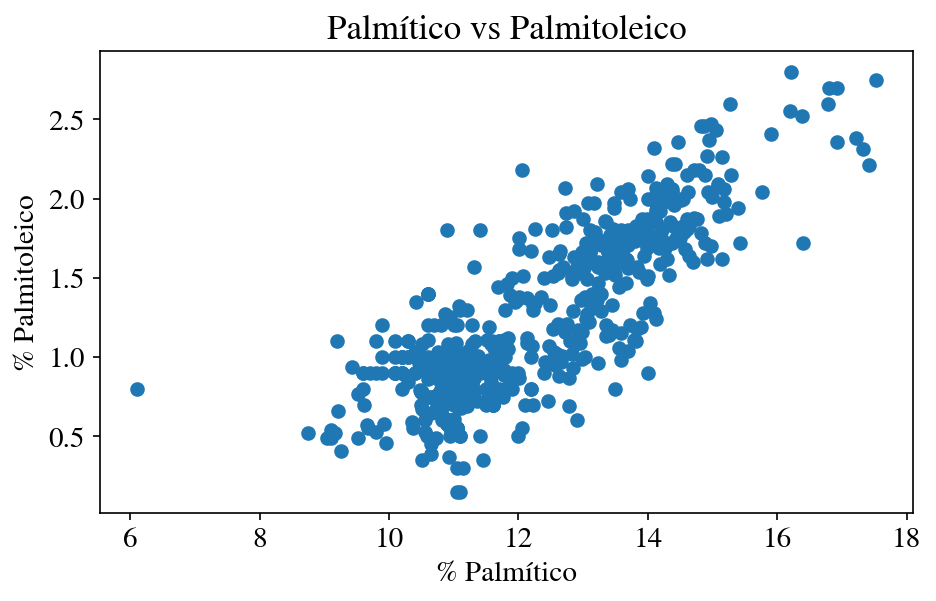

In [34]:
# Definimos la figura actual
fig=plt.figure(figsize=(7, 4))

# Definimos los ejes actuales
axis = fig.gca()

# Introducimos título de la figura y de los ejes a partir del objeto axis
axis.set_title(u'Palmítico vs Palmitoleico')
axis.set_xlabel(u'% Palmítico')
axis.set_ylabel(u'% Palmitoleico')
# Crear un gráfico de dispersión directamente
axis.scatter(df_en_porcentaje["palmítico"], df_en_porcentaje["palmitoleico"])


Otra manera de visualizar 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


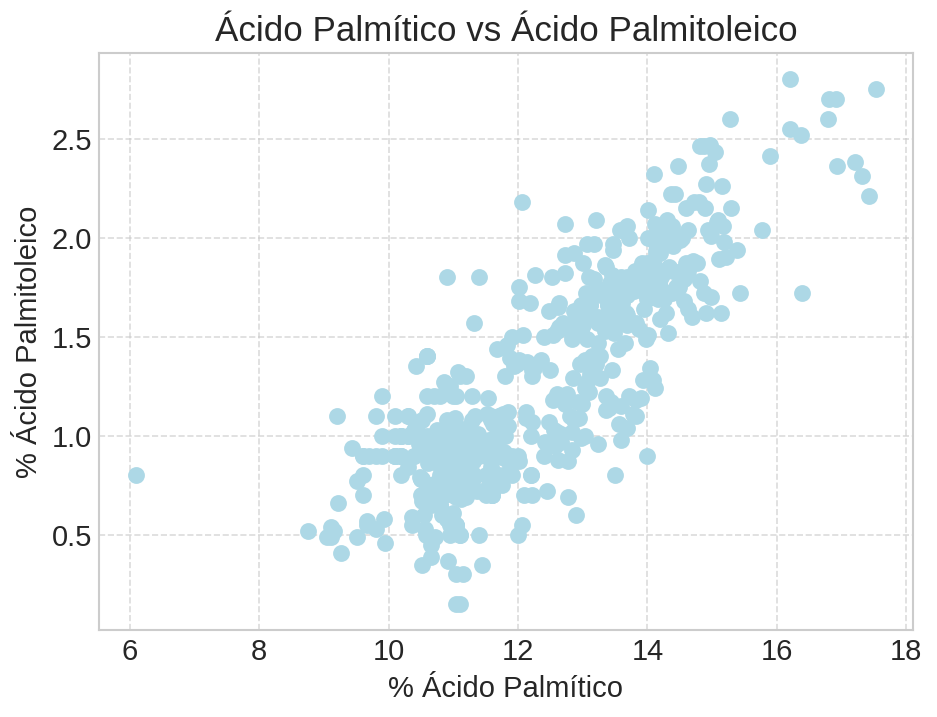

In [35]:
# Define el tamaño y el estilo del gráfico
plt.figure(figsize=(7, 5))
plt.style.use('seaborn-whitegrid')  # Utiliza un estilo de cuadrícula

# Crea un gráfico de dispersión con etiquetas para los puntos
plt.scatter(
    df_en_porcentaje["palmítico"],
    df_en_porcentaje["palmitoleico"],
    color='lightblue',  # Color de los puntos
    marker='o',    # Forma de los puntos
    s=50           # Tamaño de los puntos
)

# Establece el título y etiquetas de los ejes con caracteres Unicode
plt.title('Ácido Palmítico vs Ácido Palmitoleico')
plt.xlabel('% Ácido Palmítico')
plt.ylabel('% Ácido Palmitoleico')

# Agrega una leyenda
plt.legend()

# Agrega una cuadrícula en el fondo
plt.grid(True, linestyle='--', alpha=0.7)

Representamos gráficamente el histograma de la presencia de ácido palmitoleico en el conjunto de muestras. Hacemos uso para ello de la función `hist()`.

Hacemos pruebas para comprender la visualización de histogramas

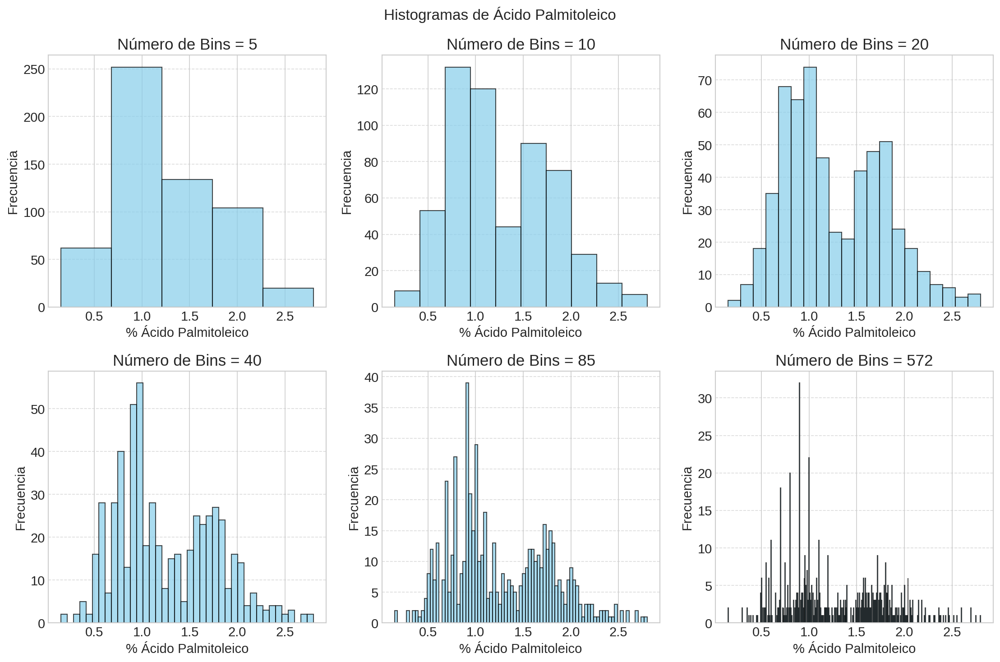

In [36]:

# Supongamos que tienes una serie llamada 'acido_palmitoleico' con los datos del ácido 
#palmitoleico. Lista de 6 números de bins diferentes que deseas probar
num_bins_list = [0.01, 0.019, 0.035, 0.07, 0.15, 1]  # Puedes ajustar esto según tus preferencias

# Calcula el número de filas y columnas necesarias para organizar los subplots
num_rows = 2  # Puedes ajustar esto según tus preferencias
num_cols = 3

# Crea subplots para cada valor de num_bins
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

# Añade un título al conjunto de subplots
fig.suptitle('Histogramas de Ácido Palmitoleico', fontsize=16)

# Itera sobre los diferentes valores de num_bins y crea histogramas en los subplots
for i, num_bins in enumerate(num_bins_list):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    num_bins = int(df_en_porcentaje["palmitoleico"].size * num_bins)
    ax.hist(df_en_porcentaje["palmitoleico"], bins=num_bins, color='skyblue', edgecolor='black', alpha=0.7)
    ax.set_title(f'Número de Bins = {num_bins}')
    ax.set_xlabel('% Ácido Palmitoleico')
    ax.set_ylabel('Frecuencia')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Ajusta el espacio entre subplots
plt.tight_layout()

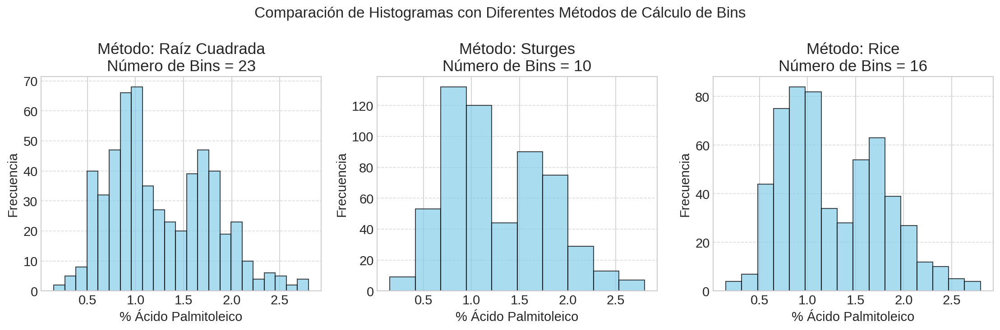

In [37]:

# Lista de métodos para calcular el número de bins
methods = ["Raíz Cuadrada", "Sturges", "Rice"]

# Crea subplots para cada método de cálculo de bins
fig, axes = plt.subplots(1, len(methods), figsize=(15, 5))

# Añade un título al conjunto de subplots
fig.suptitle('Comparación de Histogramas con Diferentes Métodos de Cálculo de Bins', fontsize=16)

# Itera sobre los diferentes métodos y crea histogramas en los subplots
for i, method in enumerate(methods):
    ax = axes[i]
    
    # Calcula el número de bins según el método
    if method == "Raíz Cuadrada":
        num_bins = int(np.sqrt(len(df_en_porcentaje["palmitoleico"])))
    elif method == "Sturges":
        num_bins = int(np.log2(len(df_en_porcentaje["palmitoleico"])) + 1)
    elif method == "Rice":
        num_bins = int(2 * len(df_en_porcentaje["palmitoleico"])**(1/3))
    
    # Crea el histograma
    ax.hist(df_en_porcentaje["palmitoleico"], bins=num_bins, color='skyblue', edgecolor='black', alpha=0.7)
    ax.set_title(f'Método: {method}\nNúmero de Bins = {num_bins}')
    ax.set_xlabel('% Ácido Palmitoleico')
    ax.set_ylabel('Frecuencia')
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Ajusta el espacio entre subplots
plt.tight_layout()

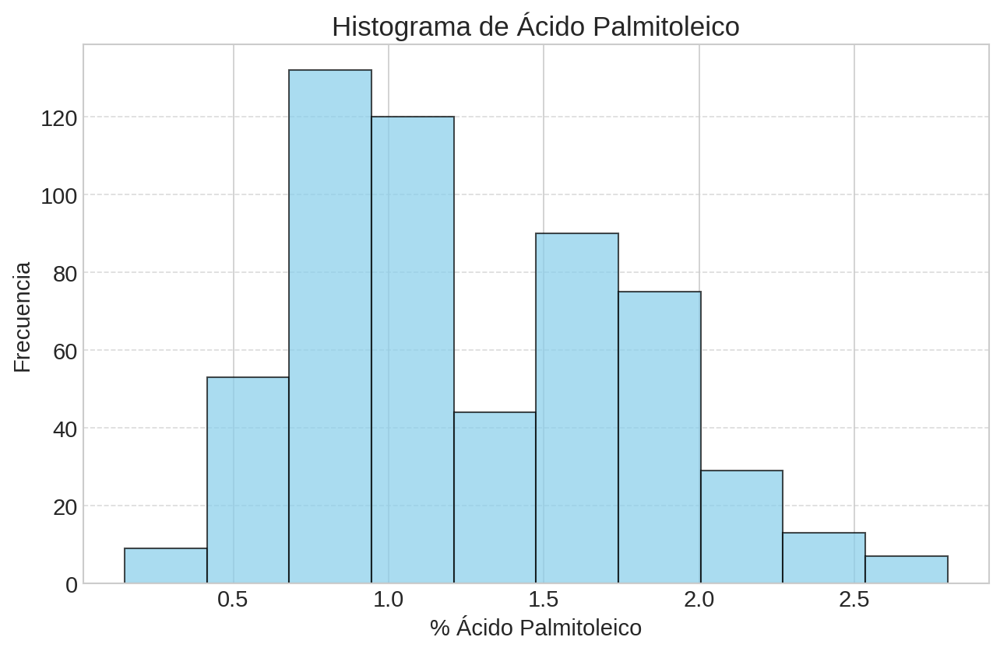

In [38]:
# histograma seleccionado
# Crea el histograma
plt.hist(df_en_porcentaje["palmitoleico"], bins=10, color='skyblue', edgecolor='black', alpha=0.7)

# Personaliza el aspecto del histograma
plt.title('Histograma de Ácido Palmitoleico')
plt.xlabel('% Ácido Palmitoleico')
plt.ylabel('Frecuencia')

# Agrega una cuadrícula en el fondo
plt.grid(axis='y', linestyle='--', alpha=0.7)

Utilizaremos la función `subplots()` para representar cuatro figuras en una matriz de dos por dos.

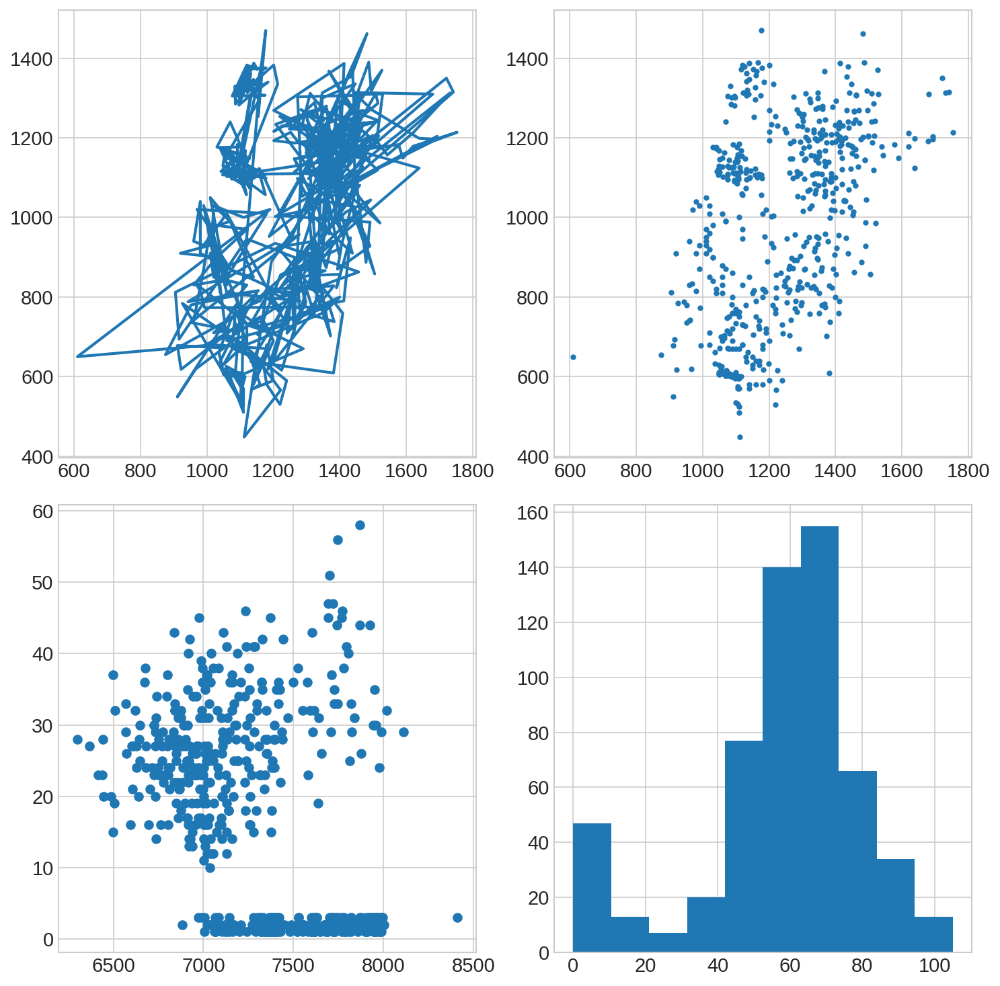

In [39]:
fig, axes=plt.subplots(figsize=(10,10), nrows=2, ncols=2)
axes[0][0].plot(datos[u'palmítico'], datos['linoleico'])
axes[0][1].plot(datos[u'palmítico'], datos['linoleico'], '.')
axes[1][0].scatter(datos['oleico'],datos['eicosenoico'])
axes[1][1].hist(datos[u'araquídico'])
fig.tight_layout()

Representaremos mediante gráficos de dispersión los ácidos grasos de la lista `acidos_y` frente a los de la lista `acidos_x`. Podemos dibujar los ácidos grasos de la lista `acidos_y`en el eje 'y' y los ácidos grasos de la lista `acidos_x` en el eje 'x'. La representación se hará mediante una matriz de figuras de 3 filas y 2 columnas. Etiquetar convenientemente cada figura. Para no contar el número de elementos en las listas, podemos utilizar la función `enumerate()`.

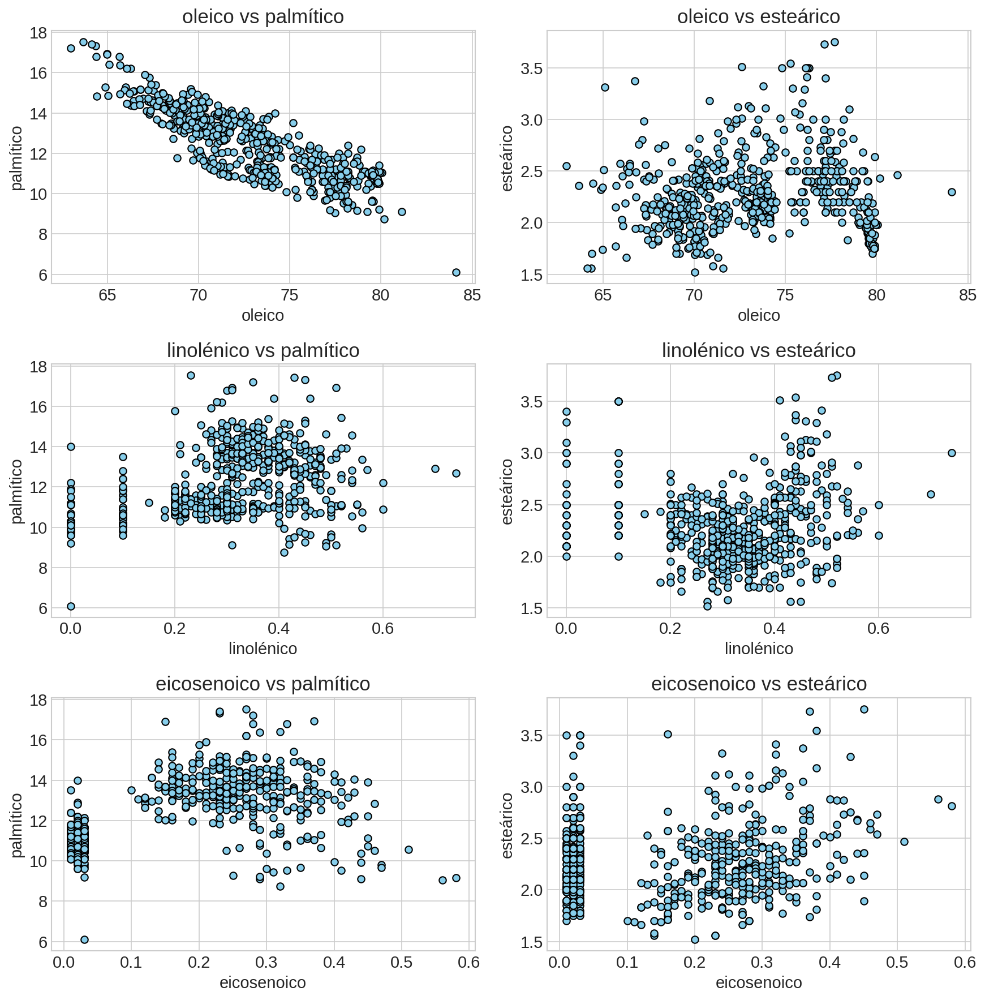

In [40]:
from itertools import product
acidos_x=[u'oleico',u'linolénico',u'eicosenoico']
acidos_y=[u'palmítico',u'esteárico']

# Utilizaremos dos bucles recorriendo la lista de acidos_x y acidos_y
# Utilizaremos dos bucles recorriendo la lista de acidos_x y acidos_y
# Crea una lista de etiquetas para las figuras

# Crea subplots en una matriz de 3x2
fig, axes = plt.subplots(3, 2, figsize=(12, 12))
# Itera sobre las listas de ácidos grasos y etiquetas utilizando enumerate
for i, (acido_x, acido_y) in enumerate(product(acidos_x, acidos_y)):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    # Crea el gráfico de dispersión
    ax.scatter(df_en_porcentaje[acido_x], df_en_porcentaje[acido_y], color='skyblue', edgecolor='black')
    ax.set_title(f'{str(acido_x)} vs {str(acido_y)}')
    ax.set_xlabel(acido_x)
    ax.set_ylabel(acido_y)

# Ajusta el espacio entre subplots
plt.tight_layout()

Utilizaremos la función `groupby()` para realizar distintos agrupamientos de los valores de la tabla. En primer lugar, agruparemos por el valor la columna `región`, que nos permitirá dividir el conjunto de datos en tres subconjuntos.

In [41]:
# Agrupar por la columna 'región'
region = df_en_porcentaje.groupby('región')
# Iterar sobre los grupos resultantes

print(f"El objeto es de tipo: {type(region)}")
display(region)
print(region)

El objeto es de tipo: <class 'pandas.core.groupby.generic.DataFrameGroupBy'>


La función `groupby()` proporciona un objeto de tipo diccionario, donde las claves son los valores que permiten el agrupamiento, y los grupos direccionados por las claves son los correspondientes subconjuntos de la matriz inicial. Podemos direccionar los tres subconjuntos correspondientes a las tres regiones iterando mediante un bucle.

In [42]:
for id_region, grupo in region:
    print(f"El objeto es de tipo: {type(grupo)}")
    print(f'Región: {id_region}')
    display(grupo.head(3))
    

El objeto es de tipo: <class 'pandas.core.frame.DataFrame'>
Región: 1


,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,10.75,0.75,2.26,78.23,6.72,0.36,0.60,0.29
1,Puglia-Nord,1,1,10.88,0.73,2.24,77.09,7.81,0.31,0.61,0.29
2,Puglia-Nord,1,1,9.11,0.54,2.46,81.13,5.49,0.31,0.63,0.29


El objeto es de tipo: <class 'pandas.core.frame.DataFrame'>
Región: 2


,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
323,Sardinia-Interno,2,5,11.29,1.20,2.22,72.72,11.12,0.43,0.98,0.02
324,Sardinia-Interno,2,5,10.42,1.35,2.10,73.76,11.16,0.35,0.90,0.03
325,Sardinia-Interno,2,5,11.03,0.96,2.10,73.80,10.85,0.32,0.94,0.03


El objeto es de tipo: <class 'pandas.core.frame.DataFrame'>
Región: 3


,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
421,Umbria,3,9,10.85,0.7,1.80,79.55,6.05,0.20,0.50,0.01
422,Umbria,3,9,10.85,0.7,1.85,79.55,6.00,0.25,0.55,0.01
423,Umbria,3,9,10.90,0.6,1.90,79.50,6.00,0.28,0.47,0.02


Como vemos, la función `groupby()` no solo realiza un agrupamiento visual, sino que identifica cada uno de los grupos como objetos en sí mismos del tipo `DataFrame`, sobre los que podemos operar. Por ejemplo, podemos utilizar la función `describe()` para analizar cada una de las regiones de un modo inmediato.

In [43]:
for id_region, grupo in region:
    print(f"El objeto describe es de tipo: {type(grupo.describe())}")
    print(f'Región: {id_region}')
    display(grupo.describe())
    

El objeto describe es de tipo: <class 'pandas.core.frame.DataFrame'>
Región: 1


,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
count,323.0,323.000000,323.000000,323.000000,323.000000,323.000000,323.000000,323.000000,323.000000,323.000000
mean,1.0,2.783282,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
std,0.0,0.741054,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
min,1.0,1.000000,8.750000,0.350000,1.520000,63.000000,4.480000,0.200000,0.320000,0.100000
25%,1.0,2.500000,12.680000,1.215000,2.015000,68.830000,8.555000,0.320000,0.560000,0.220000
50%,1.0,3.000000,13.460000,1.630000,2.230000,70.300000,10.900000,0.370000,0.620000,0.270000
75%,1.0,3.000000,14.190000,1.850000,2.495000,72.835000,12.025000,0.440000,0.690000,0.320000
max,1.0,4.000000,17.530000,2.800000,3.750000,81.130000,14.620000,0.740000,1.020000,0.580000


El objeto describe es de tipo: <class 'pandas.core.frame.DataFrame'>
Región: 2


,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
count,98.0,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000
mean,2.0,5.336735,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
std,0.0,0.475023,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
min,2.0,5.000000,10.300000,0.350000,1.990000,68.820000,10.570000,0.150000,0.450000,0.010000
25%,2.0,5.000000,10.852500,0.882500,2.120000,71.372500,11.122500,0.230000,0.660000,0.010000
50%,2.0,5.000000,11.075000,0.960000,2.220000,73.255000,11.465000,0.270000,0.720000,0.020000
75%,2.0,6.000000,11.372500,1.040000,2.395000,73.810000,13.065000,0.300000,0.810000,0.020000
max,2.0,6.000000,12.130000,1.350000,2.720000,74.390000,14.700000,0.430000,1.050000,0.030000


El objeto describe es de tipo: <class 'pandas.core.frame.DataFrame'>
Región: 3


,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
count,151.0,151.000000,151.000000,151.000000,151.000000,151.000000,151.000000,151.000000,151.000000,151.000000
mean,3.0,8.006623,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735
std,0.0,0.820542,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298
min,3.0,7.000000,6.100000,0.150000,1.700000,73.400000,5.100000,0.000000,0.000000,0.010000
25%,3.0,7.000000,10.600000,0.690000,2.000000,76.800000,6.020000,0.100000,0.100000,0.010000
50%,3.0,8.000000,10.900000,0.800000,2.300000,78.000000,6.800000,0.200000,0.380000,0.020000
75%,3.0,9.000000,11.250000,1.000000,2.500000,79.500000,8.250000,0.350000,0.595000,0.025000
max,3.0,9.000000,14.000000,1.800000,3.500000,84.100000,10.500000,0.700000,1.000000,0.030000


Un ejemplo de lo que podemos hacer es iterar sobre el conjunto de series de valores para cada columna en cada región, y calcular la desviación estándar mediante la función `std()`. Observa el tipo del resultado como conjunto de desviaciones estándar para cada columna.

In [44]:
# Excluir las columnas 'área' y 'región' del DataFrame antes de calcular las desviaciones 
# estándar ya que no tiene sentido mirar la desviación para estos parametros
columnas_a_excluir = ['área', 'región']
columnas_calculo = [col for col in datos_split.columns if col not in columnas_a_excluir]
# Calcula las desviaciones estándar para cada columna
std_dict = {}
for id_region, grupo in region:
    std = grupo[columnas_calculo].std()
    std_dict[id_region] = std

# Crea un nuevo DataFrame a partir del diccionario de desviaciones estándar
datos_std = pd.DataFrame(std_dict)
# Trasponemos para que se parezca a la tabla de abajo y la colocación sea similar 
# al DataFrame df
display(datos_std.T)

/home/alourido/anaconda3/envs/VD/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  


,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
1,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


Además, pandas permite reunir los resultados de ejecutar `std()` en un nuevo objeto del tipo `DataFrame`. Y lo hace él todo. Podemos simplemente aplicar la función `std()` sobre el resultado del agrupamiento realizado mediante `groupby()`.

In [45]:
# Calcular las desviaciones estándar utilizando groupby()
desviaciones_estandar_por_region = df_en_porcentaje.groupby('región')[columnas_calculo].std()
display(desviaciones_estandar_por_region)

,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,
1,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


También podemos utilizar la función `apply()` para aplicar una función determinada al nuevo objeto. Por ejemplo, podemos volver a realizar la media sobre los valores de las columnas de cada una de las regiones. Aunque pueden coincidir en algunos resultados, la función `apply()` opera sobre cada grupo, mientras que `aggregate()` opera sobre cada una de las columnas.

In [46]:
datos_percentage_mean = region.aggregate(np.mean)
display(datos_percentage_mean)

,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,,
1,2.783282,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,5.336735,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,8.006623,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


Renombraremos las columnas de la tabla datos_std para añadir después de cada nombre la extensión '`_std`'. Para ello podemos iterar sobre todas las cadenas de `acidos`, añadiendo la subcadena `_std` después de cada cadena. Esto se puede hacer mediante una sencilla estructura diccionario en la que hacemos corresponder a cada cadena de ácidos una nueva cadena en la que añadimos '`_std`'. La función a utilizar es `rename()` donde haremos `inplace = True` para hacer la sustitución sobre la misma estructura de datos, y no sobre una copia.

In [47]:
# Aplicar diferentes funciones de cálculo usando agg()
resultados = df_en_porcentaje.groupby('región')[columnas_calculo].agg([np.sum, np.mean, np.max, np.min,np.std])

# Usamos el traspuesto ya que no se pude visualizar la tabla entera de la otra manera
display(resultados.T)

región                        1            2             3
palmítico    sum    4303.290000  1089.120000   1653.150000
             mean     13.322879    11.113469     10.948013
             amax     17.530000    12.130000     14.000000
             amin      8.750000    10.300000      6.100000
             std       1.529349     0.404111      0.825635
palmitoleico sum     500.010000    94.810000    126.440000
             mean      1.548019     0.967449      0.837351
             amax      2.800000     1.350000      1.800000
             amin      0.350000     0.350000      0.150000
             std       0.507237     0.138514      0.264388
esteárico    sum     738.940000   221.660000    348.510000
             mean      2.287740     2.261837      2.308013
             amax      3.750000     2.720000      3.500000
             amin      1.520000     1.990000      1.700000
             std       0.398709     0.176363      0.389560
oleico       sum   22933.030000  7122.660000  11767.510000
             mean     71.000093    72.680204     77.930530
             amax     81.130000    74.390000     84.100000
             amin     63.000000    68.820000     73.400000
             std       3.451431     1.418783      1.648155
linoleico    sum    3338.200000  1172.600000   1097.820000
             mean     10.334985    11.965306      7.270331
             amax     14.620000    14.700000     10.500000
             amin      4.480000    10.570000      5.100000
             std       2.106730     1.072336      1.431226
linolénico   sum     122.950000    26.550000     32.900000
             mean      0.380650     0.270918      0.217881
             amax      0.740000     0.430000      0.700000
             amin      0.200000     0.150000      0.000000
             std       0.079727     0.053844      0.168865
araquídico   sum     203.870000    71.710000     56.740000
             mean      0.631176     0.731735      0.375762
             amax      1.020000     1.050000      1.000000
             amin      0.320000     0.450000      0.000000
             std       0.111644     0.118826      0.293586
eicosenoico  sum      88.250000     1.900000      2.980000
             mean      0.273220     0.019388      0.019735
             amax      0.580000     0.030000      0.030000
             amin      0.100000     0.010000      0.010000
             std       0.083915     0.007436      0.007298

Haremos una sencilla operación de unión entre tablas para disponer de una nueva tabla en la que representamos la media y la desviación estándar para el ácido oleico en cada una de las tres regiones. Para ello extraemos dos estructuras dataframe a partir de `datos_mean` y `datos_std` para la columna de interés. Después utilizamos la función `join()` para unir ambas estructuras.

Renombraremos las columnas de la tabla `datos_std` para añadir después de cada nombre la extensión '`_std`'. Para ello podemos iterar sobre todas las cadenas de `acidos`, añadiendo la subcadena `_std` después de cada cadena. Esto se puede hacer mediante una sencilla estructura diccionario en la que hacemos corresponder a cada cadena de ácidos una nueva cadena en la que añadimos '`_std`'. La función a utilizar es `rename()` donde haremos `inplace = True` para hacer la sustitución sobre la misma estructura de datos, y no sobre una copia.

In [48]:
desviaciones_estandar_por_region = df_en_porcentaje.groupby('región')[columnas_calculo].std()
display(desviaciones_estandar_por_region)

# Agregar "_std" al final de cada nombre de columna
desviaciones_estandar_por_region.columns = [col + '_std' for col in desviaciones_estandar_por_region.columns]
display(desviaciones_estandar_por_region)


media_por_region = df_en_porcentaje.groupby('región')[columnas_calculo].mean()
# Agregar "_mean" al final de cada nombre de columna
media_por_region.columns = [col + '_mean' for col in media_por_region.columns]
display(media_por_region)

,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,
1,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


,palmítico_std,palmitoleico_std,esteárico_std,oleico_std,linoleico_std,linolénico_std,araquídico_std,eicosenoico_std
región,,,,,,,,
1,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


,palmítico_mean,palmitoleico_mean,esteárico_mean,oleico_mean,linoleico_mean,linolénico_mean,araquídico_mean,eicosenoico_mean
región,,,,,,,,
1,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


Y ahora unimos las tablas 

In [49]:
# Unir los DataFrames usando la función join() en la columna 'región'
datos_mean_std = media_por_region.join(desviaciones_estandar_por_region, on='región')
display(datos_mean_std)

,palmítico_mean,palmitoleico_mean,esteárico_mean,oleico_mean,linoleico_mean,linolénico_mean,araquídico_mean,eicosenoico_mean,palmítico_std,palmitoleico_std,esteárico_std,oleico_std,linoleico_std,linolénico_std,araquídico_std,eicosenoico_std
región,,,,,,,,,,,,,,,,
1,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


## 2. Análisis exploratorio de datos en una dimensión

In [50]:
clave_region=[1,2,3]
valor_region=['Sud','Sardinia','Nord']
dict_region={e[0]:e[1] for e in zip(clave_region,valor_region)}
dict_region

{1: 'Sud', 2: 'Sardinia', 3: 'Nord'}

Vamos a volver sobre la tabla en la que representábamos los valores medios de cada ácido graso en cada región. En esa tabla aparecían también los valores medios del área, lo que es un tanto anómalo. Para ello extraeremos una nueva tabla en la que sólo aparecerán los valores medios correspondientes a ácidos grasos.

In [51]:
# Ya lo había hecho antes este paso
display(datos_mean_std.head())


,palmítico_mean,palmitoleico_mean,esteárico_mean,oleico_mean,linoleico_mean,linolénico_mean,araquídico_mean,eicosenoico_mean,palmítico_std,palmitoleico_std,esteárico_std,oleico_std,linoleico_std,linolénico_std,araquídico_std,eicosenoico_std
región,,,,,,,,,,,,,,,,
1,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


Realizaremos un gráfico de barras con los porcentajes relativos de ácidos grasos. Podemos utilizar la opción kind='barh'. En el gráfico llamaremos a la región 1 'Sud', a la 2 'Sardinia' y a la 3 'Nord', de acuerdo con el mapa inicialmente proporcionado.

In [52]:

# Para sacar fuera de la gráfica la leyenda y facilitar la inspección
ax.legend(loc='right',bbox_to_anchor=(1.3,0.5))
ax.set_xlim([0,100])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(0.0, 100.0)

Hemos representado las proporciones de ácidos grasos en cada región. Representaremos ahora para cada ácido graso, su distribución por regiones. Para ello, en primer lugar podemos dividir una figura en tantas subfiguras como ácidos grasos, mediante la función `subplots()`. Un lazo nos permitirá recorrer cada una de las subfiguras, y en cada una de ellas representaremos tres histogramas, cada uno de ellos representando el histograma del correspondiente ácido graso en una de las tres regiones.

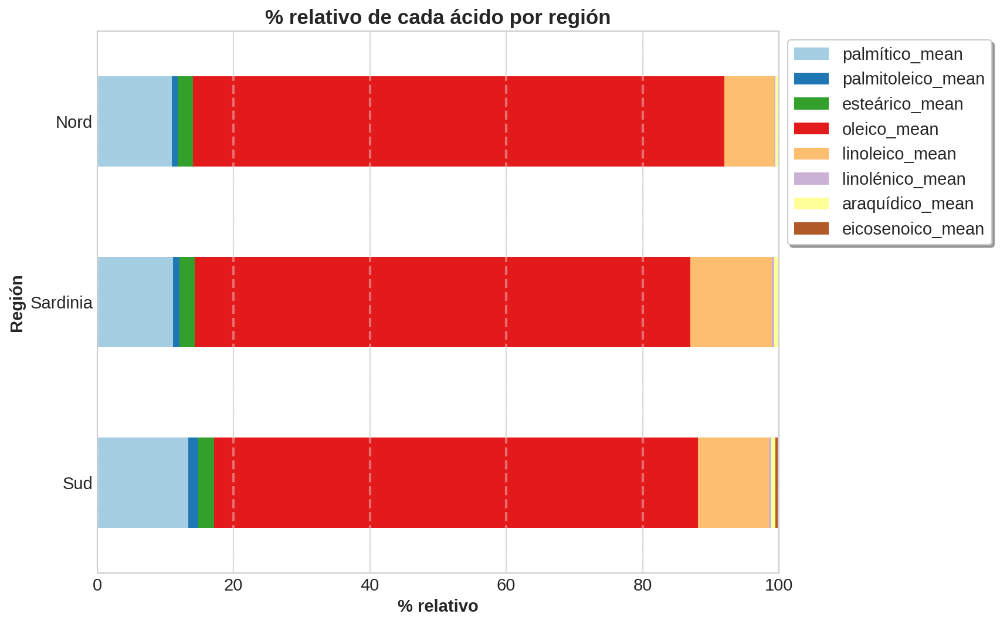

In [53]:


# Función para configurar el estilo de la gráfica
def configurar_grafica(ax,dict_name,figsize=(10, 6)):
    fig = ax.get_figure()  # Obtener la figura a la que pertenece el eje
    fig.set_size_inches(figsize)  # Configurar el tamaño de la figura
    #ax.legend(loc='right', bbox_to_anchor=(1.3, 0.5))
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=True, fancybox=True, shadow=True)
    ax.set_xlim([0, 100])
    ax.set_title("% relativo de cada ácido por región", weight='bold')
    ax.set_xlabel("% relativo", weight='bold')
    ax.set_ylabel("Región", weight='bold')
    ax.set_yticklabels([name for name in list(dict_name.values())])

    vals = ax.get_xticks()
    for tick in vals:
        ax.axvline(x=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

# colores = ['#FF5733', '#33FF57', '#5733FF', '#FF33A1', '#33A1FF', '#A1FF33', '#33FFFF', '#FFFF33']

plt.style.use('seaborn-whitegrid')
figsize=(10, 8)
# Representamos la gráfica directamente desde el DataFrame agrupado
ax = media_por_region.plot(kind='barh', stacked=True,cmap='Paired', figsize=figsize) #cmap='viridis')
# No agregamos anotaciones en las barras, debido a que no se ven correctamente ensuciando
# más el gráfico
#for i in ax.patches:
#    width, height = i.get_width(), i.get_height()
#    x, y = i.get_xy() 
#    ax.annotate(f'{width:.2f}%', (x + width/2, y + height/2), ha='center', va='center', fontsize=10, color='white')

# Configuramos el estilo de la gráfica
configurar_grafica(ax,dict_region,figsize=figsize)

# Mostramos la gráfica
plt.show()

**NOTA** ccomo se puede observar el porcentaje medio relativo a cada ácido es bastante similar,siendo el oleico el que se encuentra en mayor medida con mucha diferencia con respecto al segundo, después el palmítico y linoleico (pero distan de la concentración del oleico). Por otro lado, también se observa que en Sardinia destaca por tener en mayor cantidad el ácido linoleico y Nord por ser el que tiene menos porcentaje de los tres regiones.

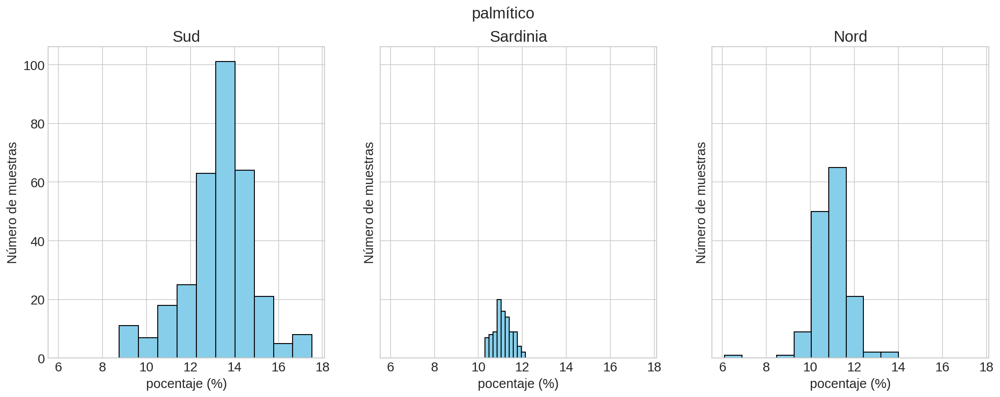

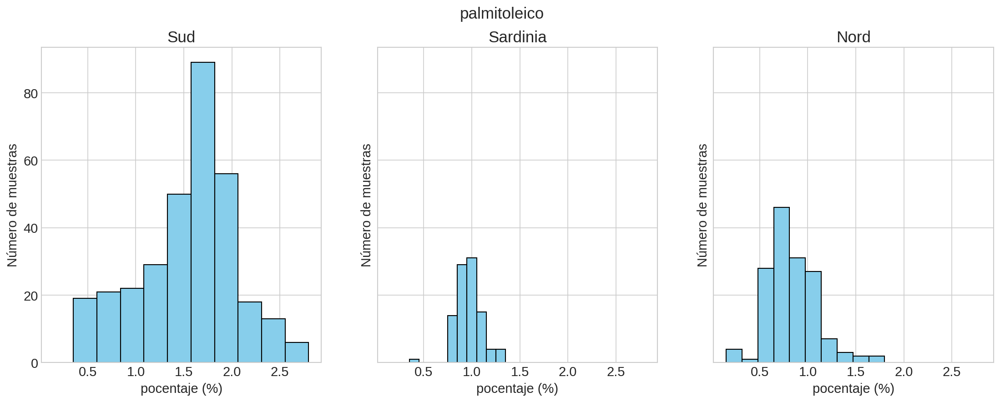

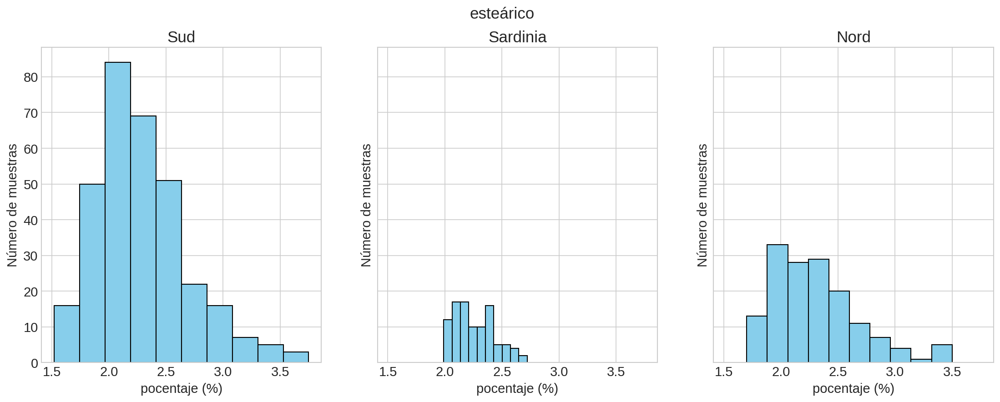

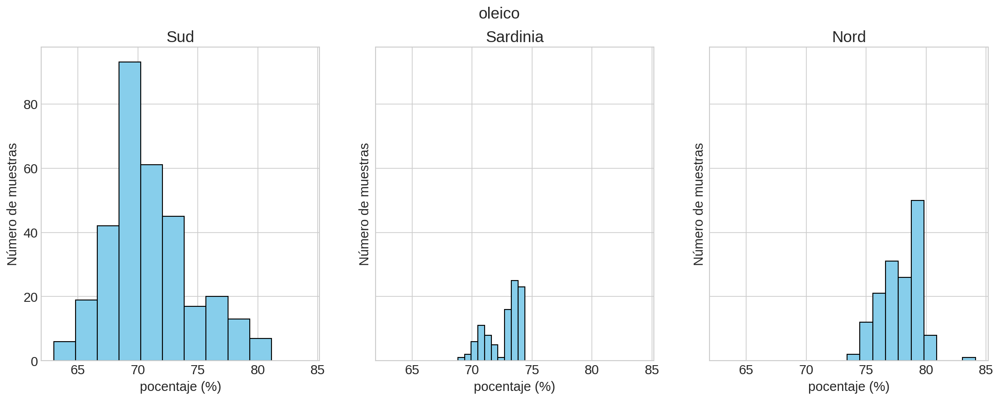

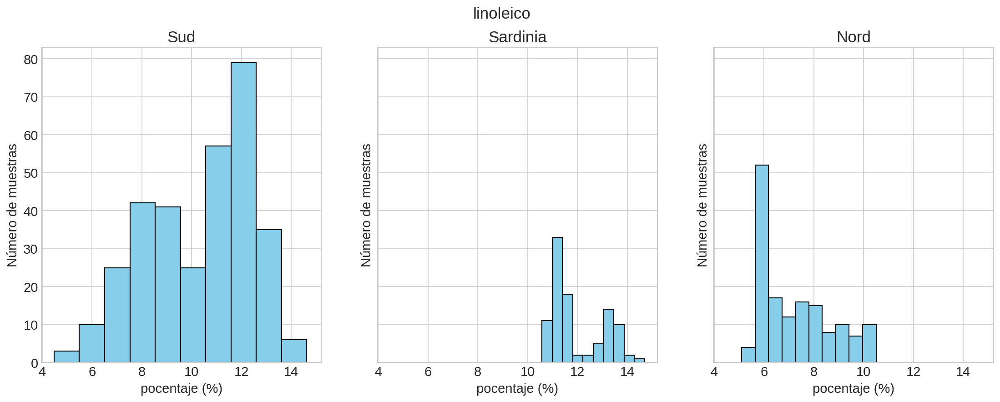

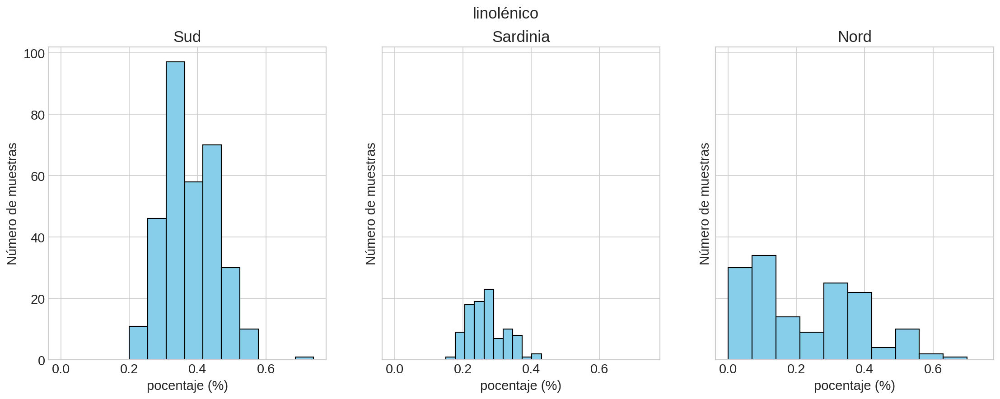

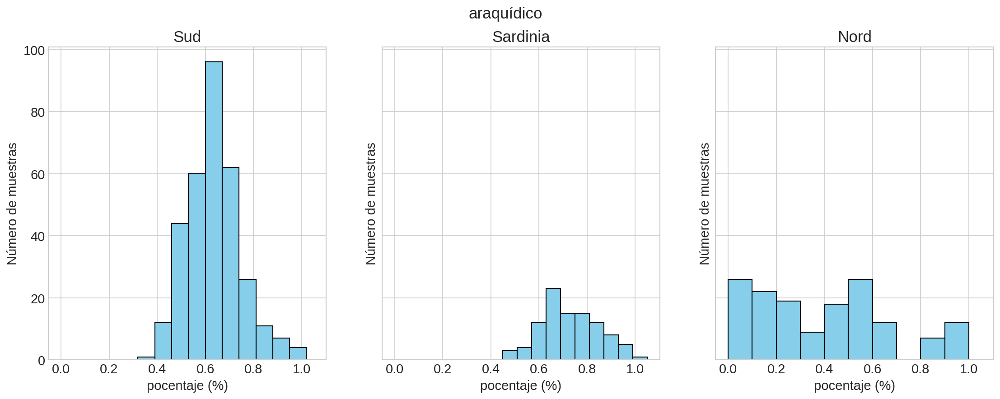

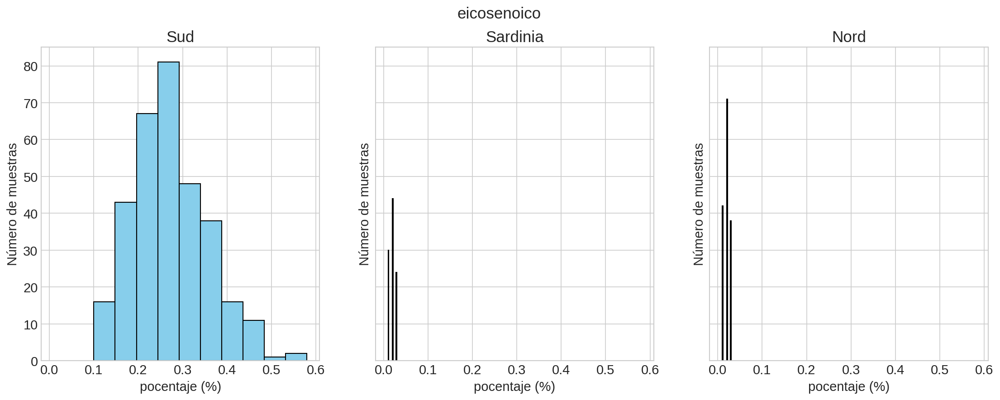

In [54]:
# Agrupamos por región
region = df_en_porcentaje.groupby('región')

# Establecemos el espaciamiento entre cada plot
fig.tight_layout(pad=2.0)

for i, acido in enumerate(acidos):
    fig, axes=plt.subplots(figsize=(18,6), nrows=1, ncols=3, sharey=True, sharex=True)
    fig.suptitle(f'{acido}', x=0.5)
    for region in range (0,3):    
        df_prov = df_en_porcentaje[df_en_porcentaje['región'] == region+1]
        axes[region].hist(df_prov[f'{acido}'],color='skyblue', edgecolor='black')
        axes[region].set_title(dict_region[region+1])
        axes[region].set_ylabel(f'Número de muestras')
        axes[region].set_xlabel(f'pocentaje (%)')

plt.show()


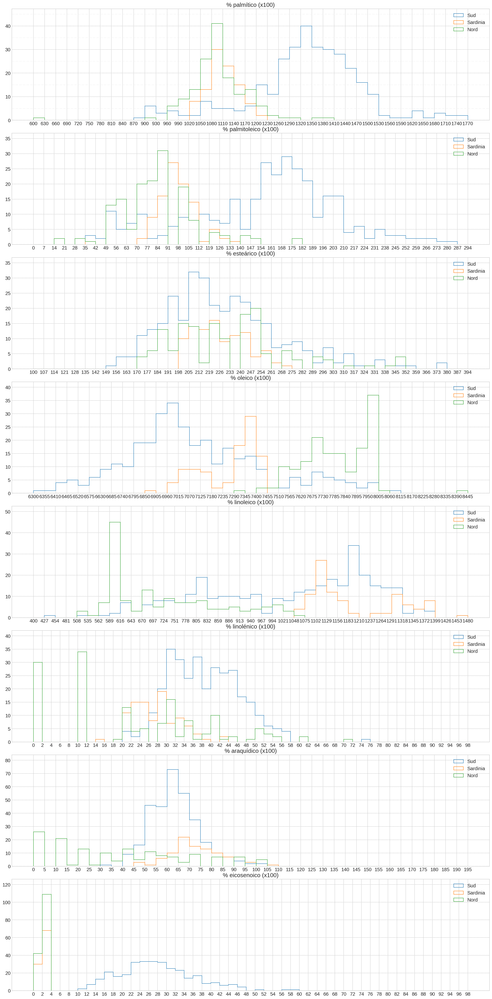

In [55]:

acidos_names = ["palmítico", "palmitoleico", "esteárico",
                "oleico", "linoleico", "linolénico", "araquídico", "eicosenoico"]
# Agrupamos por región
region = datos.groupby('región')

# Definimos las subgráficas a utilizar
fig, axes = plt.subplots(figsize=(20, 40), nrows=len(acidos_names), ncols=1)

# Establecemos el espaciado entre cada plot
fig.tight_layout()

for i, acido in enumerate(acidos_names):
    # Obtenemos los valores máximos y mínimos de todos los grupos
    max_value = region[acido].max().max()
    min_value = region[acido].min().min()

    # Redondeamos a la centena superior y a la centena inferior (mínimo cero)
    max_value = ((max_value + 100) // 100) * 100
    min_value = ((min_value // 100) * 100).clip(0)

    # Modificar el cálculo de los bins para que vayan de 2 en 2
    bins =  np.arange(min_value, max_value, int((max_value - min_value) / 40))

    for j in range(1, 4):
        data = region.get_group(j)[acido]
        axes[i].hist(data, label=dict_region[j], bins=bins, histtype='step')

    axes[i].set_xticks(bins)
    axes[i].set_xticklabels(bins)
    axes[i].legend(loc='upper right')
    axes[i].set_title(f'% {acido} (x100)')

    # Añadimos barras horizontales para cada porcentaje
    vals = axes[i].get_yticks()
    for tick in vals:
        axes[i].axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

plt.show()


Podemos calcular la frecuencia relativa acumulada del ácido graso eicosenoico respecto a un valor determinado (p.ej. 0.05) como la fracción de valores menores a 0.05 respecto al total. Para ello, podemos obtener la serie de condiciones a partir de la columna del ácido graso eicosenoico, lo que nos devolverá una serie de valores de verdad cierto o falso. Si luego sumamos mediante la función `np.sum()` los valores ciertos obtenemos el número total de valores menores que 0.05. Si aplicamos la función `np.mean()` obtenemos el valor deseado de la frecuencia relativa acumulada.

In [56]:
# Valor umbral
umbral = 0.05

def calculo_de_frecuencia(df,columnas_a_eliminar=[],umbral=0.05):

    # Crear un diccionario para almacenar los resultados
    resultados = {}
    todas_columnas=df.columns
    acidos = [col for col in todas_columnas if col not in columnas_a_eliminar]
    # Iterar a través de las columnas de ácidos grasos (excluyendo la primera columna)
    for columna in acidos:
        # Crear una serie booleana para la condición
        condicion = df[columna] < umbral

        # Calcular el total de valores que cumplen la condición
        total_valores = np.sum(condicion)

        # Calcular la frecuencia relativa acumulada
        frecuencia_relativa_acumulada = np.mean(condicion)

        # Almacenar los resultados en el diccionario
        resultados[columna] = {
            'Total_valores_bajo_umbral': total_valores,
            'Frecuencia_relativa_acumulada': frecuencia_relativa_acumulada
        }

    # Crear un DataFrame a partir del diccionario de resultados
    return pd.DataFrame(resultados).T

columnas_a_eliminar = ['procedencia', 'área', 'región']
# Mostrar el DataFrame con los resultados
display(calculo_de_frecuencia(df_en_porcentaje,columnas_a_eliminar))

,Total_valores_bajo_umbral,Frecuencia_relativa_acumulada
palmítico,0.0,0.000000
palmitoleico,0.0,0.000000
esteárico,0.0,0.000000
oleico,0.0,0.000000
linoleico,0.0,0.000000
linolénico,30.0,0.052448
araquídico,26.0,0.045455
eicosenoico,249.0,0.435315


In [57]:
for id_region, grupo in region:
    print(f"El objeto describe es de tipo: {type(grupo.describe())}")
    print(f'Región: {id_region}')
    display(calculo_de_frecuencia(grupo,columnas_a_eliminar))

El objeto describe es de tipo: <class 'pandas.core.frame.DataFrame'>
Región: 1


,Total_valores_bajo_umbral,Frecuencia_relativa_acumulada
palmítico,0.0,0.0
palmitoleico,0.0,0.0
esteárico,0.0,0.0
oleico,0.0,0.0
linoleico,0.0,0.0
linolénico,0.0,0.0
araquídico,0.0,0.0
eicosenoico,0.0,0.0


El objeto describe es de tipo: <class 'pandas.core.frame.DataFrame'>
Región: 2


,Total_valores_bajo_umbral,Frecuencia_relativa_acumulada
palmítico,0.0,0.0
palmitoleico,0.0,0.0
esteárico,0.0,0.0
oleico,0.0,0.0
linoleico,0.0,0.0
linolénico,0.0,0.0
araquídico,0.0,0.0
eicosenoico,0.0,0.0


El objeto describe es de tipo: <class 'pandas.core.frame.DataFrame'>
Región: 3


,Total_valores_bajo_umbral,Frecuencia_relativa_acumulada
palmítico,0.0,0.000000
palmitoleico,0.0,0.000000
esteárico,0.0,0.000000
oleico,0.0,0.000000
linoleico,0.0,0.000000
linolénico,30.0,0.198675
araquídico,26.0,0.172185
eicosenoico,0.0,0.000000


Con pandas podemos indexar un objeto mediante una condición. Interpreta el siguiente código

In [58]:
# nuevo DataFrame llamado 'bajo' que contiene solo las filas de 
# un DataFrame llamado 'datos'
# bajo=datos[datos[u'eicosenoico'] < 0.02]
bajo=df_en_porcentaje[df_en_porcentaje[u'eicosenoico'] < 0.02]        
pd.crosstab(bajo[u'área'],bajo[u'región'],
             margins=True, margins_name="Total")


región,2,3,Total
área,,,
5,19,0,19
6,11,0,11
7,0,17,17
8,0,11,11
9,0,14,14
Total,30,42,72


**NOTA:** Se crea un nuevo DataFrame llamado 'bajo' que contiene solo las filas de un DataFrame llamado 'datos' y cruzada entre las columnas 'área' y 'región' del DataFrame bajo. Esta tabla mostrará la frecuencia de las combinaciones únicas de valores en las columnas 'área' y 'región' que cumplen con la condición datos[u'eicosenoico'] < 0.02.
La tabla muestra la distribución de las regiones en función de las áreas 

cuando el valor en la columna 'eicosenoico' es menor que 0.02%:

- En el área 5, todas las muestras (19 en total) pertenecen a la región 2.
- En el área 6, todas las muestras (11 en total) pertenecen a la región 2.
- En el área 7, todas las muestras (17 en total) pertenecen a la región 3.
- En el área 8, todas las muestras (11 en total) pertenecen a la región 3.
 - En el área 9, todas las muestras (14 en total) pertenecen a la región 3.

En total, hay 30 muestras en la región 2 y 42 muestras en la región 3 que cumplen con la condición de que el valor en la columna 'eicosenoico' sea menor que 0.02%. Por otro lado, en la región 1 no hay ningun caso en el que se cumpla la condición de que que sea menor que 0.02%.

Como se pude observar los datos extraidos en esta tabla coinciden con los que se obtuvieron en las tablas que se generaron en el apartado anterior por región.

Hemos visto que el ácido oleico domina a los demás, lo que dificulta el análisis del resto de ácidos grasos. Eliminaremos el ácido oleico y representaremos los demás de nuevo mediante un diagrama de barras. ¿Qué podemos decir respecto al ácido eicosenoico?

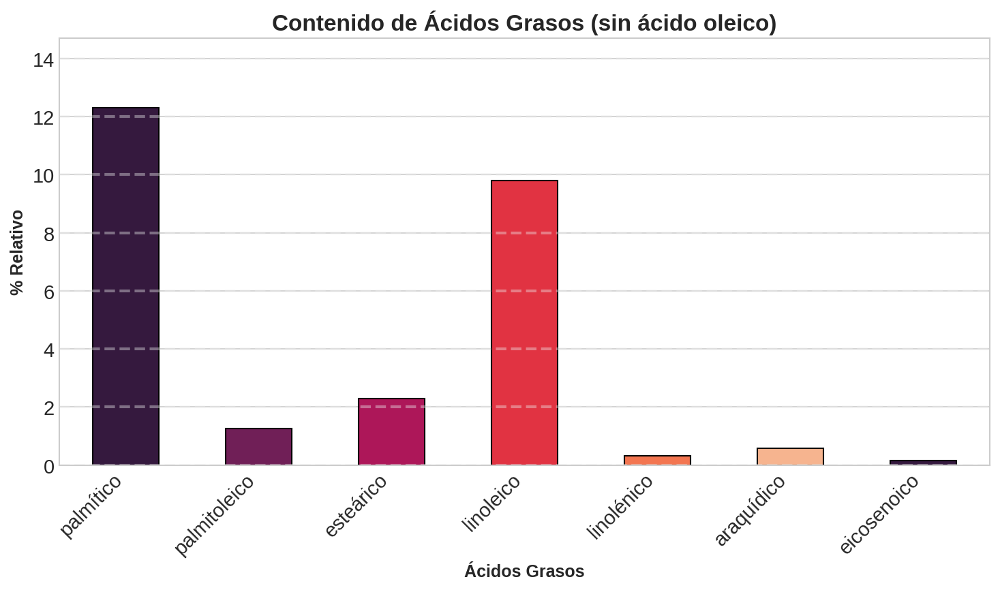

In [59]:
import seaborn as sns  # Importa Seaborn
# Nombres de los ácidos grasos restantes
menosoleico = ['palmítico', 'palmitoleico', 'esteárico',
               'linoleico', 'linolénico', 'araquídico', 'eicosenoico']

# Calcula primero la información a representar (media de cada ácido)
datos_mean_percentage = df_en_porcentaje.loc[:, menosoleico].apply(np.mean)

# Crea una figura y ejes personalizados
fig, ax = plt.subplots(figsize=(10, 6))


# Utiliza una paleta de colores Seaborn
colors = sns.color_palette("rocket")

# Representa la gráfica de barras
datos_mean_percentage.plot(kind='bar', color=colors, ax=ax, edgecolor='black')

# Estilo y etiquetas
ax.set_title("Contenido de Ácidos Grasos (sin ácido oleico)", fontsize=16, weight='bold')
ax.set_xlabel('Ácidos Grasos', fontsize=12, weight='bold')
ax.set_ylabel('% Relativo', fontsize=12, weight='bold')
ax.set_xticklabels(menosoleico, rotation=45, ha='right')
# Desactiva las líneas verticales del grid
ax.xaxis.grid(False)

# Añadir barras horizontales para cada porcentaje
vals = ax.get_yticks()
for tick in vals:
    ax.axhline(y=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

# Mostrar la gráfica
plt.tight_layout()
plt.show()


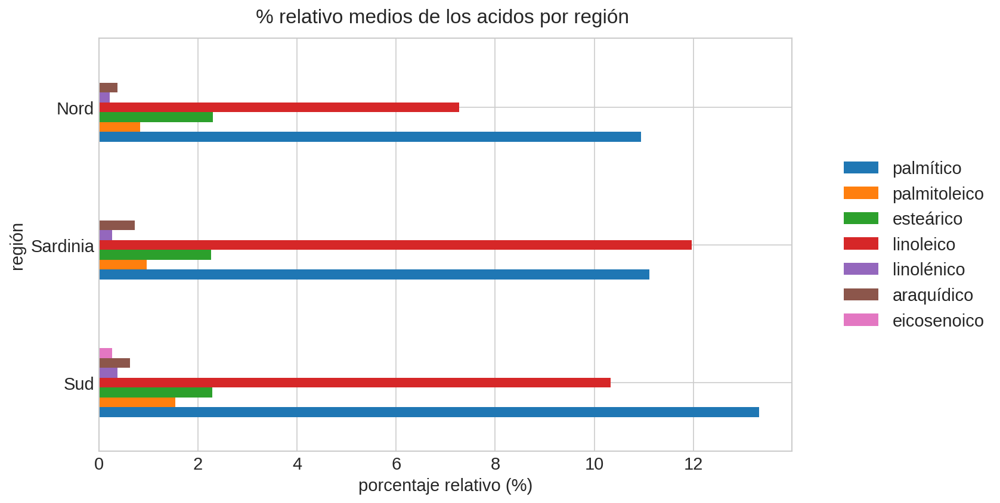

In [60]:


menosoleico_2 = ['región','palmítico', 'palmitoleico', 'esteárico',
               'linoleico', 'linolénico', 'araquídico', 'eicosenoico']

datos_menosoleico=df_en_porcentaje.loc[:, menosoleico_2].groupby('región').mean()

ax = datos_menosoleico.plot(kind = 'barh')
ax.legend(loc='right',bbox_to_anchor=(1.3,0.5))
ax.set_yticklabels(list(dict_region.values()))
ax.set_xlabel('porcentaje relativo (%)')

ax.set_title('% relativo medios de los acidos por región ', fontsize=16, y=1.02)

plt.show()

**NOTA:** 
En relación al ácido eicosenoico en las muestras de aceites de oliva, se puede afirmar que su presencia es marginal en el conjunto de datos. Este ácido exhibe un porcentaje relativo significativamente bajo, siendo inferior al 0.5% en todas las regiones analizadas. Estos resultados sugieren que el ácido eicosenoico no desempeña un papel sustancial en la composición de los aceites de oliva en este estudio.

El análisis visual y cuantitativo confirma que la región 1 (Sud) es la única que presenta una detección no despreciable de ácido eicosenoico en sus muestras. En contraste, en las demás regiones, este ácido se encuentra en cantidades mínimas y no contribuye significativamente a la composición de los aceites de oliva en estas áreas geográficas. Su presencia limitada subraya su carácter secundario en la composición química de los aceites de oliva en las regiones analizadas.

Representa tres gráficos, uno por cada región, con los diagramas de cajas para cada uno de los ácidos grasos, menos el oleico. ¿Podemos decir algo respecto al ácido linoleico?

In [61]:
#plt.figure(figsize=(28,5))
#for clave, group in datos.groupby(u'región'):


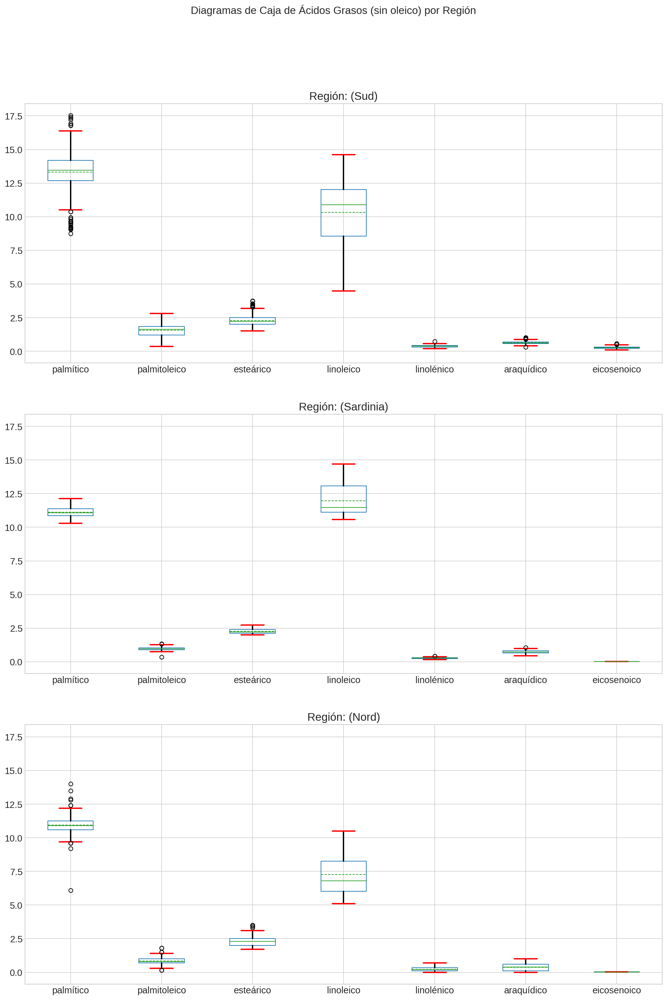

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

# Nombres de los ácidos grasos restantes
menosoleico = ['palmítico', 'palmitoleico', 'esteárico',
               'linoleico', 'linolénico', 'araquídico', 'eicosenoico']

# Agrupar por la columna 'región'
regiones = df_en_porcentaje.groupby('región')

# Crear subplots para cada región
fig, axs = plt.subplots(3, 1, figsize=(15,21), sharey=True)

# Definir paleta de colores
colors = sns.color_palette("Set3")

# Iterar a través de las regiones y crear un diagrama de caja para cada ácido
for clave, group in regiones:
    bp = group[menosoleico].boxplot(ax=axs[clave-1],
                                    showmeans=True, meanline=True,
                                    #patch_artist=True,
                                    #boxprops=dict(facecolor=colors[5]),
                                    whiskerprops=dict(color="black", linewidth=2),
                                    capprops=dict(color="red", linewidth=2))
    
    #sns.boxplot(data= group[menosoleico],showmeans=True, meanline=True,
    #            palette="Spectral", ax=axs[clave-1])
    axs[clave-1].set_title(f"Región: ({dict_region[clave]})")

# Añadir título general
fig.suptitle('Diagramas de Caja de Ácidos Grasos (sin oleico) por Región', fontsize=16, y=1.02)

# Ajustar espaciado entre subplots
plt.tight_layout(pad=3.0)

# Mostrar la gráfica
plt.show()

**NOTA**

El análisis de los diagramas de caja que representan la concentración de diferentes ácidos grasos en las muestras de aceite de oliva en tres regiones geográficas proporciona información valiosa.

En primer lugar, se destaca que el ácido linoleico presenta un comportamiento significativamente diferente en comparación con otros ácidos grasos en todas las regiones analizadas. Su rango intercuartil es el más amplio entre todos los ácidos, lo que indica una variabilidad sustancial en la concentración de este ácido en las muestras. Esta variabilidad sugiere que algunas muestras pueden tener un porcentaje de ácido linoleico significativamente mayor que otras. A pesar de esta variabilidad, no se observan valores atípicos, lo que indica la ausencia de valores extremos en las regiones. En contra parte a lo que pasa  con el eicosenoic, que si presenta valores extremos para las 3 regiones, aunque en el Sud si tiene cierta variación y el linolénico le sucede algo similar.

Además, se destaca que el ácido palmítico y el ácido linoleico son los ácidos más abundantes, después del ácido oleico, en las muestras de aceite de oliva. En particular, la región de Sardinia exhibe un mayor contenido de ácido linoleico en comparación con las otras dos regiones, y la dispersión de los datos es menor en esta región.

Representa un diagrama de coordenadas paralelas para los distintos ácidos grasos, mediante la función parallel_coordinates(). Puede ser útil normalizar los datos para que la media sea cero. Juega con distintos valores del parámetro alpha para poder distinguir mejor los distintos haces de valores.

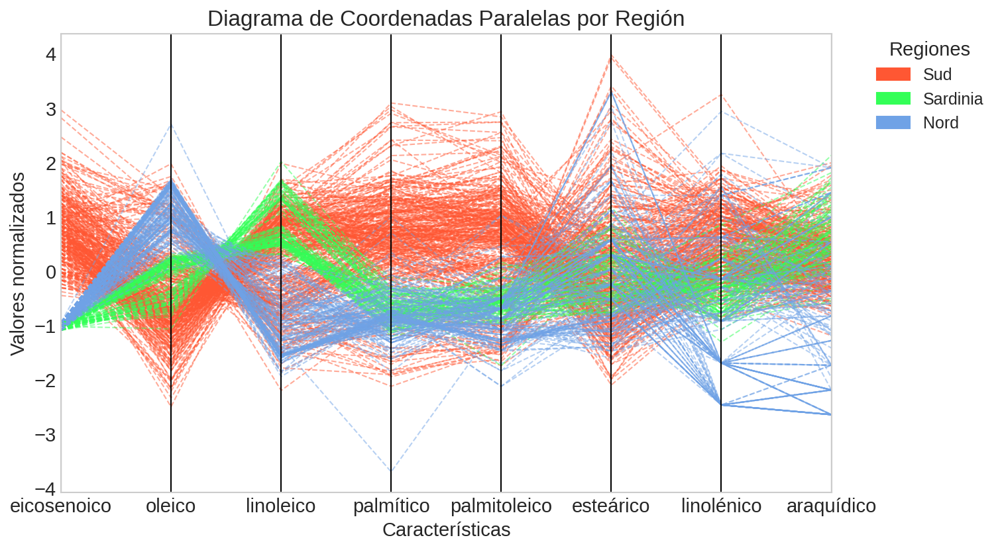

In [63]:
from pandas.plotting import parallel_coordinates
import matplotlib.patches as mpatches

#se propone un nuevo ordenamiento de los ácidos grasos 
#(se colocan al principio los que se espera que tengan mayor separabilidad)
acidos_ordenados = [u'eicosenoico', u'oleico', u'linoleico', u'palmítico'
                    ,u'palmitoleico',u'esteárico',u'linolénico',u'araquídico']

# Selecciona las columnas de datos de interés (en este caso, parece que se están
#seleccionando columnas llamadas "menosoleico" del DataFrame df_en_porcentaje):
datos_acidos = df_en_porcentaje.loc[:, acidos_ordenados]

# Normaliza los datos para que tengan una media de cero y una desviación estándar de uno.
# Esto es útil para comparar diferentes características en la misma escala:
datos_acidos_normalized = (datos_acidos - datos_acidos.apply(np.mean)) / datos_acidos.apply(np.std)

# Agrega la columna "región" original de los datos para poder usarla en la representación:
datos_acidos_normalized["región"] = datos["región"]

# Crea el gráfico de coordenadas paralelas utilizando parallel_coordinates.
# Los datos normalizados se pasan como argumento junto con la columna de clase "región".
# También se especifica un esquema de colores y una transparencia para las líneas de los 
# gráficos:
# Colores 
# colores_azules = ['#1f77b4', '#aec7e8', '#6baed6', '#3182bd', '#9ecae1', '#08519c']
# colores_azules_contraste = ['#0077b6', '#4ea8de', '#6fa2e6', '#78c2ad', '#add8e6', 
#'#87CEEB']

colores = ['#FF5733', '#33FF57', '#6fa2e6']
#colores = ['#FF5733', '#33FF57', '#3366FF']
#colores = ['#A8DADC', '#457B9D', '#1D3557']
#colores = [ '#FF9933', '#FF3366', '#33FF99']


ax = parallel_coordinates(
    datos_acidos_normalized, class_column="región", color=colores, alpha=0.5, linestyle="dashed", linewidth=1)

# Establece un título para el gráfico:
ax.set_title("Diagrama de Coordenadas Paralelas por Región", fontsize=16)

# Personaliza las etiquetas de los ejes:
ax.set_xlabel("Características")
ax.set_ylabel("Valores normalizados")

# Agrega una cuadrícula de fondo:
ax.grid(color='white', linestyle='--', linewidth=0.5)

# Cambia el color de fondo del gráfico a blanco:
ax.set_facecolor('white')
lable_of_region=[mpatches.Patch(color=colores[i], label=dict_region[i+1]) for i in range (len(dict_region))]
# Crea parches de colores y etiquétalos con los nombres de las regiones utilizando el diccionario dict_region:
# Agrega una leyenda al gráfico a la derecha en un recuadro:

ax.legend(handles=lable_of_region, loc="upper left", fontsize=12, title="Regiones",
          bbox_to_anchor=(1.05, 1), borderaxespad=0.0)



**CONCLUSIÓN**

Los gráficos de coordenadas paralelas proporcionan una perspicaz visión de la capacidad de ciertos ácidos grasos para discriminar entre las muestras de las tres regiones geográficas en estudio. A través de nuestro análisis, se destaca que el ácido eicosenoico se erige como un factor distintivo que permite separar eficazmente las muestras de la región Sud de las demás regiones.

Notamos que el ácido eicosenoico desempeña un papel destacado en la separación de las muestras de la región Sud, y también podría ser indicativo de otras diferencias regionales. La presencia notable de ácido eicosenoico en la región Sud puede servir como una característica única que distingue a esta región de las demás.

Además, se observa que los ácidos oleico y linoleico parecen ser indicativos para distinguir entre las muestras de la región Sardinia y las muestras de la región Nord. Esta observación respalda la idea de que la composición de ácidos grasos en los aceites de oliva de diferentes regiones puede variar de manera significativa, lo que los hace distinguibles entre sí.


Representa un diagrama de dispersión del ácido linoleico frente al araquídico, diferenciando las tres regiones. Este gráfico es útil cuando queremos enfatizar un aspecto visual de los datos en una justificación. ¿Qué podemos decir respecto a la separabilidad de las distintas regiones? 

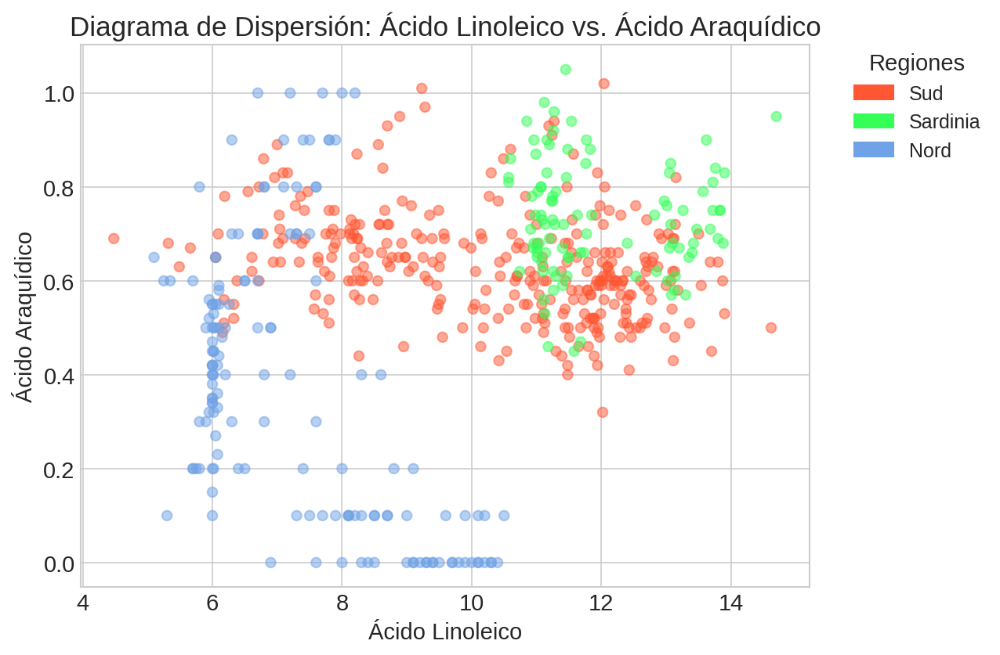

In [64]:
# Crear una figura y un objeto de ejes (ax)
fig, ax = plt.subplots(figsize=(8, 6))

# Datos
regiones = df_en_porcentaje['región']
colores = ['#FF5733', '#33FF57', '#6fa2e6']
colores_of_region = [colores[region_id-1] for region_id in regiones]

# Dibujar los puntos de cada región en un color diferente en el objeto 'ax'
ax.scatter(df_en_porcentaje["linoleico"], df_en_porcentaje["araquídico"], c=colores_of_region,alpha=0.5)

# Etiquetar los ejes en el objeto 'ax'
ax.set_xlabel('Ácido Linoleico')
ax.set_ylabel('Ácido Araquídico')

# Agregar un título en el objeto 'ax'
ax.set_title('Diagrama de Dispersión: Ácido Linoleico vs. Ácido Araquídico')

# Crear etiquetas de región para la leyenda
labels = [mpatches.Patch(color=colores[i], label=dict_region[i+1]) for i in range(len(dict_region))]

# Agregar la leyenda fuera del gráfico en el objeto 'ax' en la parte superior
ax.legend(handles=labels, loc="upper left", fontsize=12, title="Regiones",
          bbox_to_anchor=(1.05, 1), borderaxespad=0.0)



**Respuesta**
El análisis de los diagramas de dispersión de los ácidos linoleico y araquídico en las tres regiones geográficas nos proporciona valiosa información sobre la composición de los aceites de oliva en cada área. A través de estas observaciones, se pueden extraer patrones distintivos que destacan las diferencias entre las regiones.

En primer lugar, se destaca que la región de Sardinia presenta valores significativamente más altos de ácido linoleico y ácido araquídico en comparación con las otras dos regiones. Esto sugiere que las muestras de Sardinia tienen una mayor proporción de estos ácidos en su composición, lo que podría influir en el sabor y las características de los aceites de oliva de esta región.

En segundo lugar, la región Nord se caracteriza por tener los valores más bajos de ácido araquídico en comparación con las otras dos regiones, lo que indica una concentración menor de este ácido en los aceites de la región Nord en general. En cuanto al ácido linoleico, las muestras de la región Nord exhiben valores bajos a intermedios, y esta tendencia se comparte con la región Sud. Sin embargo, es importante notar que la región Sud también muestra algunas muestras con valores más altos de ácido linoleico en comparación con la región Nord.

Estos patrones de separabilidad basados en los ácidos grasos nos brindan información valiosa sobre la composición de los aceites de oliva en las distintas regiones geográficas. Sin embargo, es importante tener en cuenta que, a pesar de estos patrones, en algunos casos, como en las regiones Sud y Sardinia, la superposición de datos dificulta la separación clara de las regiones en un espacio bidimensional.

Representa mediante diagramas de dispersión los distintos ácidos grasos dos a dos. No es necesario permutar los parámetros en la representación. Indaga sobre la separabilidad observada.

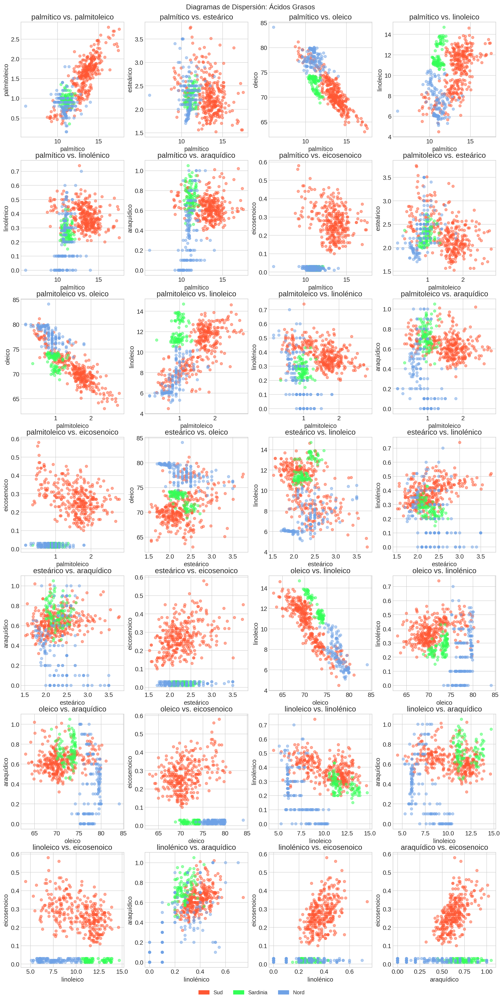

In [65]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

h=16
# Datos
acidos_names = df_en_porcentaje.columns[3:]
# Crear una figura y un conjunto de subgráficos
fig, axes = plt.subplots(nrows=len(
    acidos_names)-1, ncols=int(len(acidos_names)/2), figsize=(h, h*2))

columna=0
fila=0
num_col=int(len(acidos_names)/2)

colores = ['#FF5733', '#33FF57', '#6fa2e6']
colores_region = plt.cm.tab10.colors  # Paleta de colores "tab10" de Matplotlib

colores_of_region = [colores[region_id-1] for region_id in regiones]

for i, acid1 in enumerate(acidos_names):
    for j, acid2 in enumerate(acidos_names):
        if i < j:  # Evitar gráficos duplicados y gráficos de un ácido consigo mismo
            ax = axes[fila, columna]
            # colocamos cierta transparencia para poder visualizar si hay superposiciones
            ax.scatter(df_en_porcentaje[acid1], df_en_porcentaje[acid2], c=colores_of_region,alpha=0.5)
            ax.set_xlabel(acid1)
            ax.set_ylabel(acid2)
            ax.set_title(f'{acid1} vs. {acid2}')
            columna+=1
            if columna%num_col==0:
                columna=0
                fila+=1
            


# Añadir un título general
fig.suptitle('Diagramas de Dispersión: Ácidos Grasos', fontsize=16)

# Añadir un espacio en blanco
plt.figtext(0.5, 0.88, '', ha='center', va='center', fontsize=16)

# Crear etiquetas de región en formato horizontal
label_patches = [mpatches.Patch(color=colores[i], label=dict_region[i+1]) for i in range(len(dict_region))]

# Añadir la leyenda con espaciado y etiquetas más juntas
fig.legend(handles=label_patches, loc="lower center", ncol=len(label_patches), fontsize=12)


# Ajustar el espaciado entre los subgráficos y eliminar el espacio entre el título y las
#gráficas
plt.tight_layout(rect=[0, 0.01, 1, 0.99], h_pad=0.01, w_pad=0.01)


# Mostrar la figura
plt.show()


**CONCLUSIONES**

El análisis detallado de los datos nos permite observar:

En primer lugar, que se identifican pares de ácidos grasos que son especialmente efectivos para distinguir las muestras de cada región. En segundo lugar, se observa una correlación entre varios ácidos, como el oleico y el linoleico, que presentan una relación inversa. Del mismo modo, el oleico y el palmitoleico muestran una relación inversa, mientras que el palmítico y el palmitoleico tienen una relación directa. Además, se identifican zonas donde otros ácidos también muestran correlaciones, como el eicosenoico con el linoleico y el araquidónico en la region de Sud.

En la región de Sardinia, los pares de ácidos como palmitico vs oleico, palmítico vs linoleico, palmitoleico vs linoleico y oleico vs linoleico resultan fundamentales para la separación de las muestras. La combinación de estos ácidos en pares demuestra ser útil para discernir las procedencias geográficas.

Por otro lado, en la región Sud, los pares de ácidos palmítico vs eicosenoico, palmitoleico vs eicosenoico, esteárico vs eicosenoico y linolénico vs eicosenoico emergen como los más significativos para separar las muestras. Es notable que el ácido eicosenoico, por sí solo, basta para distinguir las muestras de la región Sud.

Para todas las regiones, observamos que los ácidos eicosenoico, oleico y linoleico desempeñan un papel clave en la separación de las muestras. Este hallazgo se ve respaldado tanto en los gráficos de coordenadas paralelas como en los de dispersión, indicando que estos ácidos son indicativos de la procedencia geográfica de las muestras.

Adicionalmente, se destacan algunas conclusiones generales al observar los diagramas de dispersión de ácidos dos a dos. Se observa que la región Sardinia cuenta con un número menor de muestras, lo que puede influir en su diferenciación. La región Sud tiende a mostrar la mayor separabilidad en la mayoría de los casos, lo que sugiere que sus aceites son los más fácilmente distinguibles por sabor. Por último, la región Nord presenta la mayor variabilidad entre las muestras, lo que podría implicar una consistencia de sabor menor en comparación con otras regiones.

Hasta aquí hemos realizado un análisis de los distintos aceites según su región de procedencia. Podríamos extender el trabajo a las distintas áreas de procedencia, analizando igualmente la separabilidad. ¿Qué podríamos concluir?

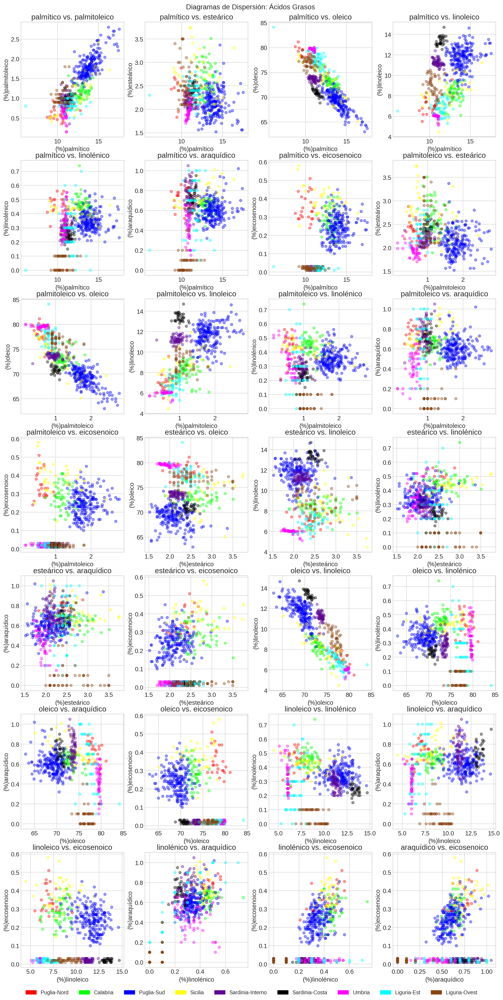

In [66]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

h=16
# Datos
acidos_names = df_en_porcentaje.columns[3:]

columna=0
fila=0
num_col=int(len(acidos_names)/2)# 3 #int(len(acidos_names)/2)
filas = len(acidos_names)-1 #len( acidos_names)//num_col # len(acidos_names)-1
# Crear una figura y un conjunto de subgráficos
fig, axes = plt.subplots(nrows=filas, ncols=num_col, figsize=(h, h*2))


procedencia=df_en_porcentaje['procedencia']
procedencia_unique=list(df_en_porcentaje['procedencia'].unique())
#colores = ['#FF5733', '#33FF57', '#6fa2e6']
#colores=  ['#FF5733', '#33FF57', '#6fa2e6', '#FF6B6B', '#70A1FF', '#FFCE6B', '#FF33A6', 
#'#A3FF70', '#6BFFCE', '#FFC56B']  # Paleta de colores "tab10" de Matplotlib
colores =  [
    '#FF0000',  # Rojo
    '#00FF00',  # Verde
    '#0000FF',  # Azul
    '#FFFF00',  # Amarillo
    '#5F0695',  # Morado
    '#000000',  # Negro
    '#FF00FF',  # Rosa
    '#00FFFF',  # Cian
    '#8B4513'   # Marron
]
#colores=['#FF5733', '#33FF57', '#6FA2E6', '#FF6B6B', '#70A1FF', '#FFCE6B', '#FF33A6', 
#'#A3FF70', '#6BFFCE', '#FFC56B']


colores_of_region = [colores[procedencia_unique.index(region_id)] for region_id in  procedencia ]

for i, acid1 in enumerate(acidos_names):
    for j, acid2 in enumerate(acidos_names):
        if i < j:  # Evitar gráficos duplicados y gráficos de un ácido consigo mismo
            ax = axes[fila, columna]
            # colocamos cierta transparencia para poder visualizar si hay superposiciones
            ax.scatter(df_en_porcentaje[acid1], df_en_porcentaje[acid2], c=colores_of_region,alpha=0.4)
            ax.set_xlabel('(%)'+acid1)
            ax.set_ylabel('(%)'+acid2)
            ax.set_title(f'{acid1} vs. {acid2}')
            columna+=1
            if columna%num_col==0:
                columna=0
                fila+=1
            


# Añadir un título general
fig.suptitle('Diagramas de Dispersión: Ácidos Grasos', fontsize=16)

# Añadir un espacio en blanco
plt.figtext(0.5, 0.88, '', ha='center', va='center', fontsize=16)

# Crear etiquetas de región en formato horizontal
label_patches = [mpatches.Patch(color=colores[i], label=procedencia_unique[i]) for i in range(len(procedencia_unique))]

# Añadir la leyenda con espaciado y etiquetas más juntas
fig.legend(handles=label_patches, loc="lower center", ncol=len(label_patches), fontsize=12)


# Ajustar el espaciado entre los subgráficos y eliminar el espacio entre el título y 
# las gráficas
plt.tight_layout(rect=[0, 0.01, 1, 0.99], h_pad=0.01, w_pad=0.01)


# Mostrar la figura
plt.show()

**COMENTARIO**

El análisis de los datos revela descubrimientos en cuanto a la composición de ácidos grasos en diversas áreas geográficas. Se observa una correlación entre varios ácidos, como el oleico y el linoleico, que presentan una relación inversa. Del mismo modo, el oleico y el palmitoleico muestran una relación inversa, mientras que el palmítico y el palmitoleico tienen una relación directa. Además, se identifican zonas donde otros ácidos también muestran correlaciones, como el eicosenoico con el linoleico y el araquidónico en las zonas de Calabria, Puglia-Sud, Sicilia y Puglia-Nord.

Un análisis comparativo entre el linoleico y el eicosenoico sugiere la posibilidad de una clasificación sencilla, ya que se observa una clara diferencia en los valores, especialmente en las áreas de Liguria-Est, Liguria-Ovest, Sardinia-Interno, Sardinia-Costa y Umbria. En particular, los valores de eicosenoico son inferiores al 0.1% en estas áreas, y los valores de linoleico muestran un rango con poca superposición.

También es relevante considerar el análisis del ácido palmítico en comparación con el linoleico, ya que se observa una agrupación de datos en clusters basados en su procedencia geográfica. Destacan especialmente los datos de Sardinia, donde el área de Sardinia Interno presenta valores cercanos a 11
para el ácido linoleico y 11 para el ácido palmítico, mientras que el área de Sardinia Costa muestra valores alrededor de 13 y 12. Además, Umbria presenta un patrón similar en esta comparación teniendo un valor próximo a 6 en valor del ácido linoleico y 11 para el ácido palmítico .

Cabe destacar que Liguria-Ovest se distingue por mantener valores constantes en algunos ácidos, independientemente de los valores de otros ácidos, como el linolénico, que toma los valores 0.1 o 0. Además, el ácido araquidónico presenta valores de 0, 0.1, 0.2 y 0.4, aunque con poca variación. Se observa una tendencia similar en Liguria-Est para estos mismos ácidos, aunque con valores diferentes. Umbria también muestra esta característica en los ácidos linoleico, oleico y palmítico, aunque los valores no son exactos, sino que tienen un rango de variación reducido.

A nivel regional, destaca el área de Puglia-Sud, que se diferencia notablemente de las demás áreas debido a sus valores únicos en ácidos grasos. Esto confirma la conclusión previa de que la región Sud en su conjunto se caracteriza por la presencia de aceites específicos, siendo Puglia-Sud un contribuyente significativo a esta diferenciación.
En cuanto al ácido eicosenoico, se revela que cuatro áreas, Puglia-Nord, Calabria, Puglia-Sud y Sicilia, presentan una concentración considerable de este ácido en sus aceites, en contraste con las demás áreas que tienen cantidades insignificantes. Por otro lado, Liguria-Ovest destaca por valores bajos en la mayoría de los ácidos grasos, pero muestra una alta presencia de ácido oleico, lo que sugiere una menor diversidad en la composición de ácidos grasos en esta área.

Es importante señalar que la visualización gráfica de estos datos puede ser compleja, especialmente al utilizar colores para identificar las áreas, debido a la superposición de múltiples colores.

In [67]:
media_por_procedencia = df_en_porcentaje.groupby('procedencia')[columnas_calculo].mean()
valor_region=media_por_procedencia.index
clave_region=list(range(0,len(valor_region)))
dict_region={e[0]:e[1] for e in zip(clave_region,valor_region)}
dict_region

{0: 'Calabria',
 1: 'Liguria-Est',
 2: 'Liguria-Ovest',
 3: 'Puglia-Nord',
 4: 'Puglia-Sud',
 5: 'Sardinia-Costa',
 6: 'Sardinia-Interno',
 7: 'Sicilia',
 8: 'Umbria'}

In [68]:
display(media_por_procedencia)

,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
procedencia,,,,,,,,
Calabria,13.022321,1.213571,2.625179,73.071786,8.190000,0.455714,0.636250,0.283214
Liguria-Est,11.454000,0.842000,2.414000,77.460000,6.894000,0.264000,0.636000,0.018800
Liguria-Ovest,10.528000,1.076000,2.574000,76.742000,8.972000,0.046000,0.066000,0.020600
Puglia-Nord,10.270000,0.616000,2.348400,78.204000,7.058400,0.425600,0.719600,0.345600
Puglia-Sud,13.956699,1.839223,2.109806,69.112087,11.663107,0.347087,0.597330,0.242282
Sardinia-Costa,11.381818,1.010606,2.438182,70.857879,13.372727,0.237576,0.719697,0.018788
Sardinia-Interno,10.977231,0.945538,2.172308,73.605385,11.250769,0.287846,0.737846,0.019692
Sicilia,12.283611,1.049167,2.738889,73.578333,8.347222,0.424722,0.755556,0.384444
Umbria,10.863725,0.598824,1.943333,79.557059,5.970980,0.341176,0.424314,0.019804


In [69]:
# Para sacar fuera de la gráfica la leyenda y facilitar la inspección
ax.legend(loc='right',bbox_to_anchor=(1.3,0.5))
ax.set_xlim([0,100])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(0.0, 100.0)

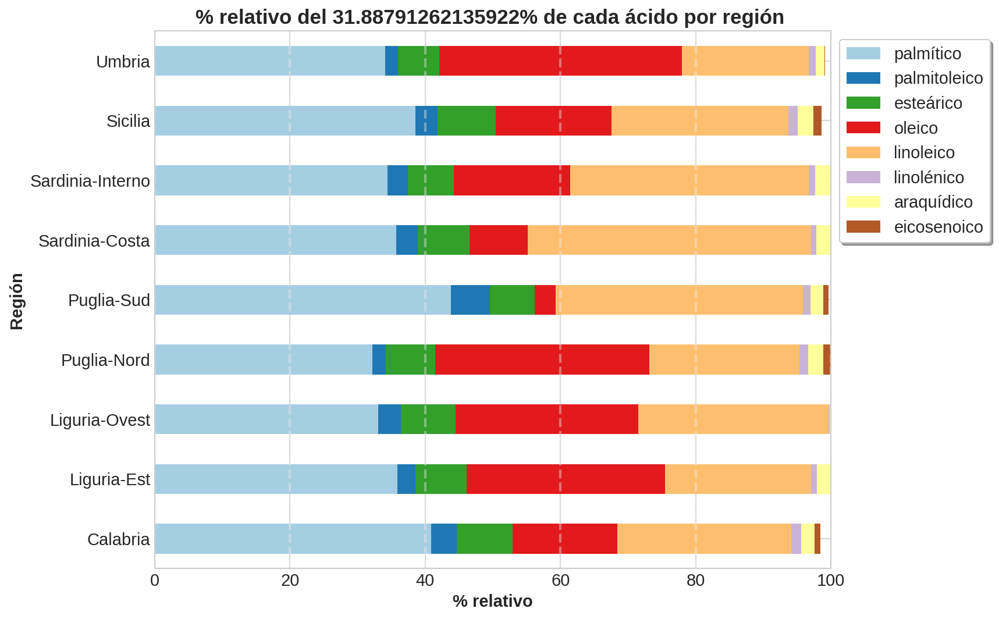

In [70]:


# Función para configurar el estilo de la gráfica
def configurar_grafica(ax,dict_name,porentaje,figsize=(10, 6)):
    fig = ax.get_figure()  # Obtener la figura a la que pertenece el eje
    fig.set_size_inches(figsize)  # Configurar el tamaño de la figura
    #ax.legend(loc='right', bbox_to_anchor=(1.3, 0.5))
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1), frameon=True, fancybox=True, shadow=True)
    ax.set_xlim([0, 100])
    ax.set_title(f"% relativo del {porentaje}% de cada ácido por región ", weight='bold')
    ax.set_xlabel("% relativo", weight='bold')
    ax.set_ylabel("Región", weight='bold')
    ax.set_yticklabels([name for name in list(dict_name.values())])

    vals = ax.get_xticks()
    for tick in vals:
        ax.axvline(x=tick, linestyle='dashed', alpha=0.4, color='#eeeeee', zorder=1)

        
# colores = ['#FF5733', '#33FF57', '#5733FF', '#FF33A1', '#33A1FF', '#A1FF33', '#33FFFF', '#FFFF33']
plt.style.use('seaborn-whitegrid')
figsize=(10, 8)
# Representamos la gráfica directamente desde el DataFrame agrupado
min_oleico=media_por_procedencia['oleico'].min()-1
resto_de_acidos=100-min_oleico
media_por_procedencia_resto_acidos=media_por_procedencia.copy()
media_por_procedencia_resto_acidos['oleico'] = media_por_procedencia_resto_acidos['oleico'] - min_oleico
# calculamos el % correspondiente a el % restante de valores quitando el mínimo de oleico
media_por_procedencia_resto_acidos=media_por_procedencia_resto_acidos*100/resto_de_acidos

#print(media_por_procedencia['oleico'].min(),media_por_procedencia_resto_acidos['oleico'].min())
ax = media_por_procedencia_resto_acidos.plot(kind='barh', stacked=True,cmap='Paired', figsize=figsize) #cmap='viridis')
# Agregamos anotaciones en las barras no se ven correctametn ensucian mas el grafico
#for i in ax.patches:
#    width, height = i.get_width(), i.get_height()
#    x, y = i.get_xy() 
#    ax.annotate(f'{width:.2f}%', (x + width/2, y + height/2), ha='center', va='center', fontsize=10, color='white')

# Configuramos el estilo de la gráfica
configurar_grafica(ax,dict_region,resto_de_acidos,figsize=figsize)

# Mostramos la gráfica
plt.show()

**COMENTARIO**

Destaca Liguria, Sardinia y Umbria por presentar valores casi inexistentes de eicosenoico. Y en la procedencia de Liguria-Ovest también presenta valores inexistentes de linolénico


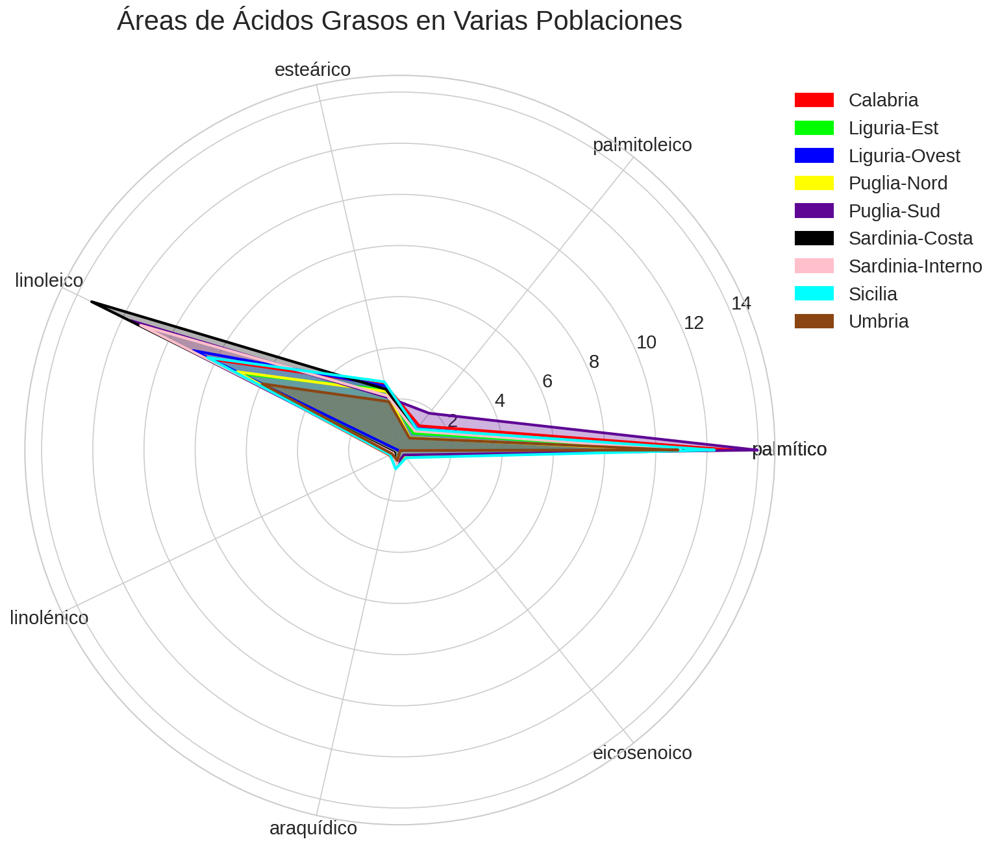

In [71]:
import numpy as np
import matplotlib.pyplot as plt

# Lista de variables (ácidos grasos)
variables = acidos_names

# Definimos la lista de columnas que queremos utilizar
columns = ["palmítico", "palmitoleico", "esteárico", "linoleico", "linolénico", "araquídico", "eicosenoico"]

# Descartamos la columna del ácido oleico
area_mean_sin_oleico = media_por_procedencia.loc[:, columns]

categories = area_mean_sin_oleico.columns
categories = [*categories, categories[0]]

label_loc = np.linspace(start=0, stop=2 * np.pi, num=len(categories))

plt.figure(figsize=(12, 10))
plt.subplot(polar=True)

# Lista de colores personalizados
colores =  [
    '#FF0000',  # Rojo
    '#00FF00',  # Verde
    '#0000FF',  # Azul
    '#FFFF00',  # Amarillo
    '#5F0695',  # Morado
    '#000000',  # Negro
    '#FFC0CB',  # Rosa
    '#00FFFF',  # Cian
    '#8B4513'   # Marron
]

# Estilo de líneas discontinuas
line_styles = ['-']

# Superponer los datos de todas las poblaciones
for i, poblacion in enumerate(media_por_procedencia.index):
    acido = area_mean_sin_oleico.loc[poblacion, :]
    acido = [*acido, acido[0]]
    color = colores[i % len(colores)]
    line_style = line_styles[i % len(line_styles)]  # Ciclar los estilos de líneas si hay más poblaciones que estilos
    plt.plot(label_loc, acido, label=poblacion, color=color, linestyle=line_style)
    plt.fill_between(label_loc, acido, alpha=0.3, color=color)

plt.title('Áreas de Ácidos Grasos en Varias Poblaciones', size=20, y=1.05)
lines, labels = plt.thetagrids(np.degrees(label_loc), labels=categories)

# Crear etiquetas de poblaciones como leyendas
label_patches = [mpatches.Patch(color=colores[i % len(colores)], linestyle=line_styles[i % len(line_styles)], label=poblacion) for i, poblacion in enumerate(media_por_procedencia.index)]

# Agregar una leyenda personalizada a la derecha del gráfico en forma de tabla
plt.legend(handles=label_patches, loc="upper right", bbox_to_anchor=(1.3, 1))

plt.show()





**COMENTARIO**
Como se ha comentado con anterioridad se puede observar que el eicosenoico tiene valores muy bajos para todas las zonas de procedencia. Pero por un lado, Sardinia destaca por tener valores altos en linoleico de media , por el otro lado Puglia-Sud se diferencia en tener una
media de valores más altos en palmitoleico.

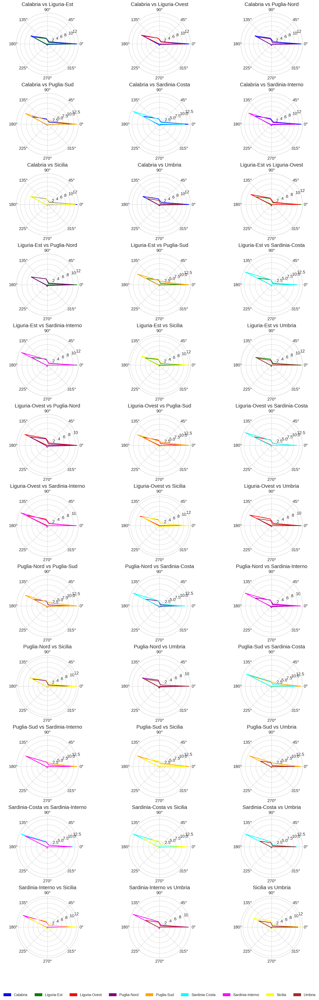

In [72]:
import itertools

# Obtén todas las combinaciones posibles de 2 procedencias sin repetir
procedencias_combinations = list(itertools.combinations(media_por_procedencia.index, 2))
name_procedencia=media_por_procedencia.index
# Definimos la lista de columnas que queremos utilizar
columns = ["palmítico", "palmitoleico", "esteárico", "linoleico", "linolénico", "araquídico", "eicosenoico"]

# Descartamos la columna del ácido oleico
area_mean_sin_oleico = media_por_procedencia.loc[:, columns]

# Definir el número de filas y columnas en la matriz de gráficos
num_rows = 12  # Puedes ajustar el número de filas según tus necesidades
num_cols = len(procedencias_combinations) // num_rows 

# Tamaño de la figura
fig_width = 16
fig_height = 4 * num_rows

# Crear una figura y una matriz de subgráficos
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(fig_width, fig_height),subplot_kw={'polar': True})

# Utilizar una lista de colores para los gráficos
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']
colors_procedencia=dict(zip(name_procedencia, colors))
# Recorrer todas las combinaciones y crear los gráficos de araña
for i, (p1, p2) in enumerate(procedencias_combinations):
    row = i // num_cols
    col = i % num_cols
    #print(row,col)
    ax = axes[row, col]
    #ax = plt.subplot(polar=True)  # Corregido

    # Obtener los datos para las dos procedencias
    data_p1 = area_mean_sin_oleico.loc[p1,:]
    data_p2 = area_mean_sin_oleico.loc[p2,:]
    data_p1 = [*data_p1, data_p1[0]]
    data_p2 = [*data_p2, data_p2[0]]
    # Asegurarse de que ambos conjuntos de datos tengan la misma longitud
    if len(data_p1) != len(data_p2):
        print(f"Los conjuntos de datos para {p1} y {p2} no tienen la misma longitud.")
        continue  # Salta esta combinación

    # Definir colores para las dos procedencias
    color_p1 = colors_procedencia[p1]
    color_p2 = colors_procedencia[p2]

    # Dibujar los datos de las dos procedencias en el mismo gráfico de araña
    ax.plot(label_loc, data_p1, label=p1, color=color_p1)
    ax.plot(label_loc, data_p2, label=p2, color=color_p2)

    # Establecer un título para el subgráfico
    ax.set_title(f'{p1} vs {p2}')
    # Crear etiquetas de poblaciones como leyendas
    #label_patches = [mpatches.Patch(color=colores[i % len(colores)],\
    #                 linestyle=line_styles[i % len(line_styles)], label=poblacion)\
    #                 for i, poblacion in enumerate((p1, p2))]

    # Agregar una leyenda personalizada a la derecha del gráfico en forma de tabla
    #ax.legend(handles=label_patches, loc="upper right", bbox_to_anchor=(1.3, 1))

# Crear etiquetas de región en formato horizontal
label_patches = [mpatches.Patch(color=colors_procedencia[i], label=i) for i in name_procedencia]

# Añadir la leyenda con espaciado y etiquetas más juntas
fig.legend(handles=label_patches, loc="lower center", ncol=len(label_patches), fontsize=12)


# Ajustar el espaciado entre los subgráficos y eliminar el espacio entre el título y los 
# gráficos.
plt.tight_layout(rect=[0, 0.03, 1, 0.95], h_pad=0.5)

# Mostrar la figura.
plt.show()

